In [1]:
import os, sys, uproot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import HomeMade as hm
import seaborn as sb
from iminuit import Minuit
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import shap
import dill
from AppStatFunctions import Chi2Regression,UnbinnedLH, BinnedLH, add_text_to_ax, nice_string_output

In [3]:
# check iminuit version, should be 1.4.x or above
import iminuit
print(iminuit.__version__)
Nmax=2397547

1.4.9


In [4]:
hm.logit(0.5)

0.0

In [69]:
N = 5e5
if N>Nmax:
    N=Nmax
    print('Maxed out')

all_features = "v0_ks_mass v0_ks_massErr pv0_x pv0_y pv0_z a0xy a0 a0z cosTheta v0_chi2 \
v0_x v0_y v0_z v0_rxy v0_rxyErr v0_px v0_py v0_pz v0_pt v0_p \
v0_ptErr \
v0_px1 v0_py1 v0_pz1 v0_pt1 \
v0_p1 v0_px2 v0_py2 v0_pz2 v0_pt2 v0_p2 v0_phi1 v0_theta1 \
v0_qOverP1 v0_phi2 v0_theta2 v0_qOverP2 alpha calpha epsilon1 \
epsilon2 Alpha pL1 pL2 pT thetastar rapidity_ks pseudorapidity".split(" ")

path = "../../data/data15_13TeV.00267358.physics_MinBias.30062015_v0_per_0.root"
file = uproot.open(path)
data = file['tree'].pandas.df(all_features, entrystop = N)

path = "../../data/mc15_13TeV.361203.Pythia8_A2_MSTW2008LO_ND_minbias.30062015_v0_per_0.root"
file = uproot.open(path)
mc = file['tree'].pandas.df(all_features + ['trueKs'], entrystop = N)

data = data.loc[(data.v0_ks_mass > 400) & (data.v0_ks_mass < 600)]
train_data = data.sample(frac=0.7)
test_data = data[~data.index.isin(train_data.index)]

mc = mc.loc[(mc.v0_ks_mass > 400) & (mc.v0_ks_mass < 600)]
train_mc = mc.sample(frac=0.7)
test_mc = mc[~mc.index.isin(train_mc.index)]

In [4]:
import csv
with open('all_features.csv','w', newline="") as result_file:
    wr = csv.writer(result_file)
    wr.writerows(all_features)

In [5]:
def load_features(filepath):
    features=[]
    with open(filepath, newline='') as csvfile:
            reader = csv.reader(csvfile)
            for row in reader:
                features.append("".join(row))
    return features

In [168]:
from scipy.optimize import curve_fit
from scipy.stats import norm, chi2

def fit_mass_double(xs, vals, errs, ax = None, guesses_bkgr = [0, 0, -10, 2000], guesses_sig = [498, 6, 17000], sigratio=2, depth=50, plot=True):
    """double gauss fit with mu_1=mu_2, with polynomial backgground fit: Give bincenter, vals, sig, a figure to plot, otherwise 
    it plots itself, guesses for both gaussian and background. Update might follow with updated estimation of guesses, but for
    the time being we use optimize.curvefit to give guesses for minuit
    
    Returns fig, ax, the full Minuit object, background amount and signal amount:
    """
    mask=vals>0
    xs, vals, errs=xs[mask], vals[mask], errs[mask]
    #look into automatizing the guesses
    mu, sigma, N = guesses_sig
    #Make a 5 sigma cut so only background is here
    bkgr_mask = (xs < mu-4*sigma) | (xs > mu+4*sigma)

    guesses_bkgr[-1] = (vals[np.argmin(xs-mu)]+vals[0]+vals[-1])/4
    if not ax and plot:
        fig, ax = plt.subplots(figsize = (16, 10), ncols = 2)
        ax_sig = ax[1]
        ax_all = ax[0]
        ax_all.plot(xs, vals, 'r.')
        ax_all.errorbar(xs, vals, errs, color = 'k', elinewidth = 1, capsize = 2, ls = 'none')

    def background_fit(x, a, b, c, d):
        return a * (x-mu) ** 3 + b * (x-mu) ** 2 + c * (x-mu) + d
    
    # The signal fit  Here gauss
    def sig1(x, mean, sig, size):
        return size*norm.pdf(x, mean, sig)
    
    def sig2(x, mean, sig, size):
        return size*norm.pdf(x, mean, sig)
    
    # The full fit
    def full_fit(x, mean, sig, size, f, sigmp, a, b, c, d):
        return background_fit(x, a, b, c, d) + f*sig1(x, mean, sig, size) + (1-f)*sig2(x, mean, sigmp*sig, size)
    
     # Background fit under here
    if sum(vals[bkgr_mask])==0:
        def background_fit(xs, a, b, c, d):
            return 0*xs
        b1, b2, b3, b4=0,0,0,0
    else:
        vals_b, cov_b = curve_fit(background_fit, xs[bkgr_mask], vals[bkgr_mask], p0 = guesses_bkgr)
        b1, b2, b3, b4 = vals_b
        bkgr_chi2 = Chi2Regression(background_fit, xs[bkgr_mask], vals[bkgr_mask], errs[bkgr_mask])
        bkgr_min  = Minuit(bkgr_chi2, pedantic = False, a = b1, b = b2, c = b3, d = b4)
        bkgr_min.migrad()
        counter = 0
        bkgr_min
        while not bkgr_min.valid and counter<depth:
            bkgr_min.migrad()
            counter += 1
        if not bkgr_min.valid: print("No background valid minimum found!")

        #Save guesses 
        b1, b2, b3, b4 = bkgr_min.args
    N=(max(vals[~bkgr_mask])- background_fit(xs[np.argmax(xs[~bkgr_mask])], b1, b2, b3, b4))*30
    # Full fit
    full_chi2 = Chi2Regression(full_fit, xs, vals, errs)
    full_min  = Minuit(full_chi2, pedantic = False, a = b1, b = b2, c = b3, d = b4, \
                       mean = mu, sig = sigma, size = N, f = 0.5, sigmp = sigratio)

    full_min.migrad()
    counter = 0
    while not full_min.valid and counter<5*depth:
        full_min = Minuit(full_chi2, pedantic = False, a = b1, b = b2, c = b3, d = b4, \
        mean = mu, sig = sigma*np.random.uniform(0.8,1.2), size = N*np.random.uniform(0.8,1.2),\
        f = 0.5*np.random.uniform(0.8,1.2), sigmp = sigratio*np.random.uniform(0.8,1.2))
        full_min.migrad()
        counter += 1
    if not full_min.valid: print(f"No valid double gaussian minimum found after {counter} tries!")

    mean, sig, size, f, sigmp, b1, b2, b3, b4 = full_min.args

    sig_amount = np.sum(abs(f*sig1(xs, mean, sig, size)) + (1-f)*abs(sig2(xs, mean, sigmp*sig, size)))
    bkg_amount = np.sum(abs(background_fit(xs, b1, b2, b3, b4)))
    if plot:
        ax_all.plot(xs, full_fit(xs, *full_min.args), "k-", label = "full_fit")
        ax_all.plot(xs, background_fit(xs, b1, b2, b3, b4),'b--',  label = "background_fit")

        ax_all.legend(loc = "upper right")

        # Details:
        text = {'chi2': full_min.fval, \
                'pval': chi2.sf(full_min.fval, len(xs) - len(full_min.args)), \
                'mean': f"{full_min.values['mean']:.1f} +/- {full_min.errors['mean']:.1f}",\
                'N':    f"{full_min.values['size']:.1f} +/- {full_min.errors['size']:.1f}"}

        text_output = nice_string_output(text)
        add_text_to_ax(0.55, 0.925, text_output, ax_all)

        # Plot signal seperately
        ax_sig.fill_between(xs, f*sig1(xs, mean, sig, size) + (1-f)*sig2(xs, mean, sigmp*sig, size), color = 'red', alpha = 0.5, label = "sig fit")
        ax_sig.plot(xs, f*sig1(xs, mean, sig, size),ls = '--', color = 'blue', alpha = 0.5, label = "sig fit")
        ax_sig.plot(xs, (1-f)*sig2(xs, mean, sigmp*sig, size),ls = '--', color = 'green', alpha = 0.5, label = "sig fit")

        vals_sig = vals - background_fit(xs, b1, b2, b3, b4)

        ax_sig.plot(xs, vals_sig, 'r.')
        ax_sig.errorbar(xs, vals_sig, errs, color = 'k', elinewidth = 1, capsize = 2, ls = 'none')



        text_a = {'sig_tight': np.round(f*sig_amount), \
                  'sig_broad': np.round((1-f)*sig_amount), \
                  'bkgr': np.round(bkg_amount), \
                  'sig/bkgr': sig_amount / bkg_amount}

        text_output = nice_string_output(text_a, decimals = 2)
        add_text_to_ax(0.60, 0.90, text_output, ax_sig)

        fig.tight_layout()
        return fig, ax, full_min, sig_amount, bkg_amount
    return full_min, sig_amount, bkg_amount

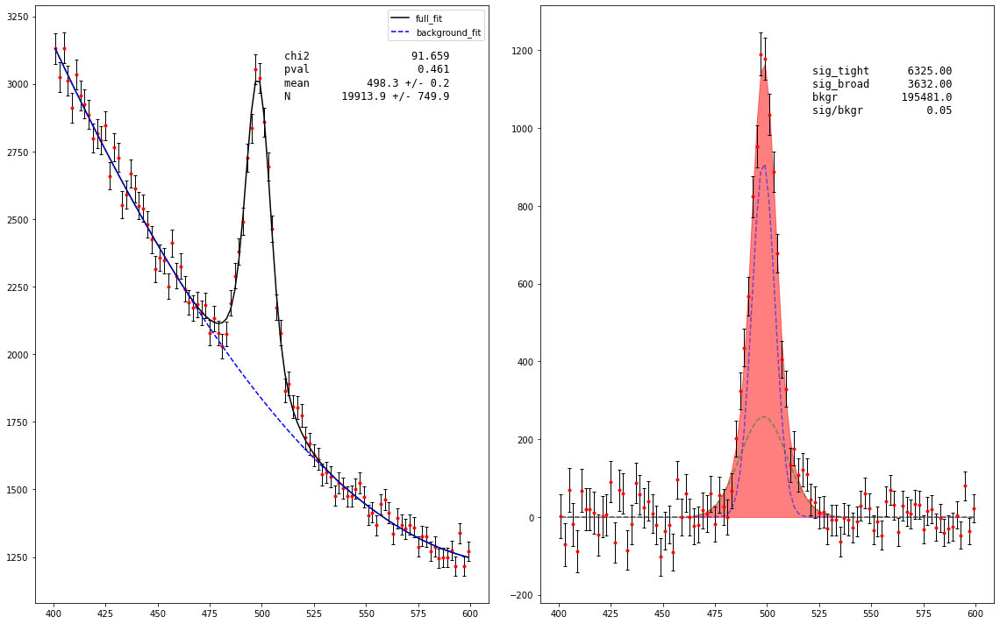

In [154]:
y, x, _ = hm.hist(data.v0_ks_mass, bins=100, range=(400,600))
fig, ax, fit, signal, bkgr = fit_mass_double(x, y, np.sqrt(y), guesses_sig=[498.9, 6, 20000])

WARNING! decrease background sample size or increase signal sample size


(498.3379940820613, 11.545205631917204)

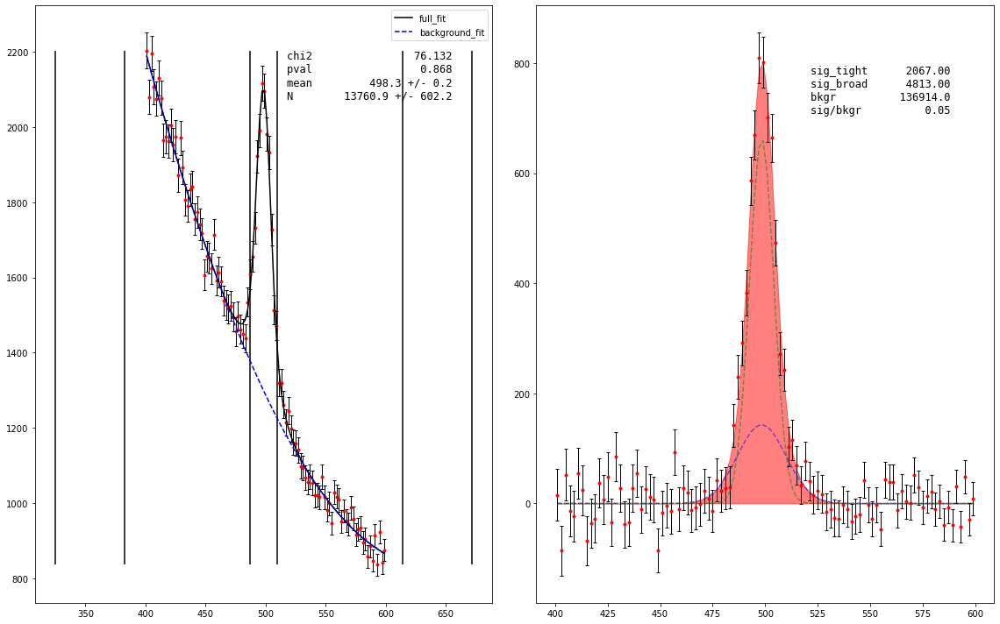

In [155]:
y, x, _ = hm.hist(train_data.v0_ks_mass,bins=100, range=(400,600))
fig, ax, M, sig, bkgr = fit_mass_double(x,y,np.sqrt(y), guesses_bkgr = [0, 0, -10, 2000], guesses_sig = [498, 6, 20000])
mean, sigma = M.values['mean'], M.values['sig']
signal = train_data.loc[(train_data.v0_ks_mass > mean - sigma) & (train_data.v0_ks_mass < mean + sigma)]
bkgr_l = train_data.loc[(train_data.v0_ks_mass > mean - 15*sigma) & (train_data.v0_ks_mass < mean - 10*sigma)]
bkgr_r = train_data.loc[(train_data.v0_ks_mass > mean + 10*sigma) & (train_data.v0_ks_mass < mean + 15*sigma)]
ax[0].vlines([mean-sigma,mean+sigma,mean-15*sigma,mean-10*sigma,mean+10*sigma,mean+15*sigma],min(y),max(y))

min_sample = min([len(signal),len(bkgr_l),len(bkgr_r)])
if min_sample != len(signal):print("WARNING! decrease background sample size or increase signal sample size")


train_data_cut = pd.concat([signal.sample(min_sample),
                   bkgr_l.sample(min_sample),
                   bkgr_r.sample(min_sample)])
train_data_cut['y'] = np.append(np.ones(min_sample),[np.zeros(min_sample),np.zeros(min_sample)])
mean, sigma

In [32]:
mass_true=train_data_cut.loc[train_data_cut.y==1]
mass_false=train_data_cut.loc[train_data_cut.y==0]

In [33]:
len(mass_false)/len(mass_true)

2.0

## Proceedings
Define new ROC-curves for XGBoost trained in data, and XGBoost trained in MC

In [12]:
model_XG=XGBClassifier()
setattr(model_XG, 'verbosity', 1)
model_XG.fit(train_data_cut[train_data_cut.columns[2:-1]],y=train_data_cut.y)

XGBClassifier()

In [24]:
p_XG = model_XG.predict_proba(test_data[test_data.columns[2:]])[:,1]

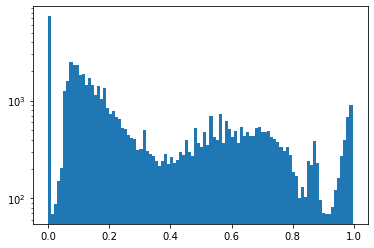

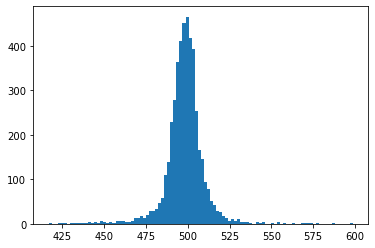

In [26]:
fig, ax = plt.subplots()
ax.hist(p_XG,bins=100);
ax.set_yscale('log')

fig, ax = plt.subplots()
ax.hist(test_data.loc[p_XG>0.8].v0_ks_mass,bins=100);

In [ ]:
def ROC_data_XG(mass, p, length=20, plot=True, label=True):
    tmp_p = np.sort(p)
    p_ranges = tmp_p[np.linspace(0,len(tmp_p)-1,length,dtype=int)]
    
    signal_count, bkgr_count = [], []
    
    mass_fig, mass_ax = plt.subplots(figsize=(16,10))
    
    for i, score in enumerate(p_ranges):
        print(i)
        y, x, _ = hm.hist(mass.loc[p>score],bins=100)
        if all(y == 0):
            continue
        
        mass_ax.plot(x,y,alpha=0.5, c='grey')
        
        if plot:
            fig, ax, M, signal, bkgr = fit_mass_double(x, y,np.sqrt(y),plot=True)
        else:
            M, signal, bkgr = fit_mass_double(x, y,np.sqrt(y),plot=False)
        signal_count.append(signal)
        bkgr_count.append(bkgr)
    return signal_count, bkgr_count

0
6075.757594984771
6211.758236931003
1
5615.418793372327
5666.598858251066
2
5355.077739232349
5242.274616344093
3
5312.035335876184
4896.519003940159
4
5254.608051903751
4490.092279310438
5
4882.422765615589
4387.550949016855
6
4855.657737428208
4153.269549192821
7
4630.797930878973
4153.863555445088
8
4575.047266169573
3649.8085459660106
9
4325.382208169217
3485.0700724534686
10
4302.207096535093
3185.8221694907143
11
3856.998383265648
3010.496931032392
12
3268.166052671413
2717.8581251194696
13
3003.4693428185906
2431.508333090662
14
2720.33151198345
1911.183904322535
15
2094.0649280457496
1696.0993147057527
16
1899.2398600960812
1288.2351693150147
17
1483.9004537954893
1559.7013322519952
18
1111.4016957135434
1122.9039522634978
19


NameError: name 'sig_count' is not defined

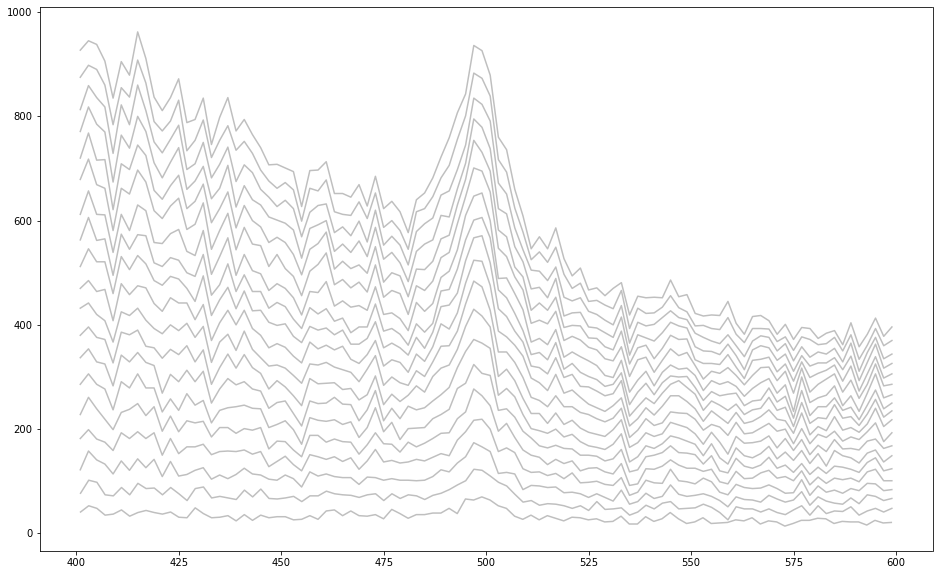

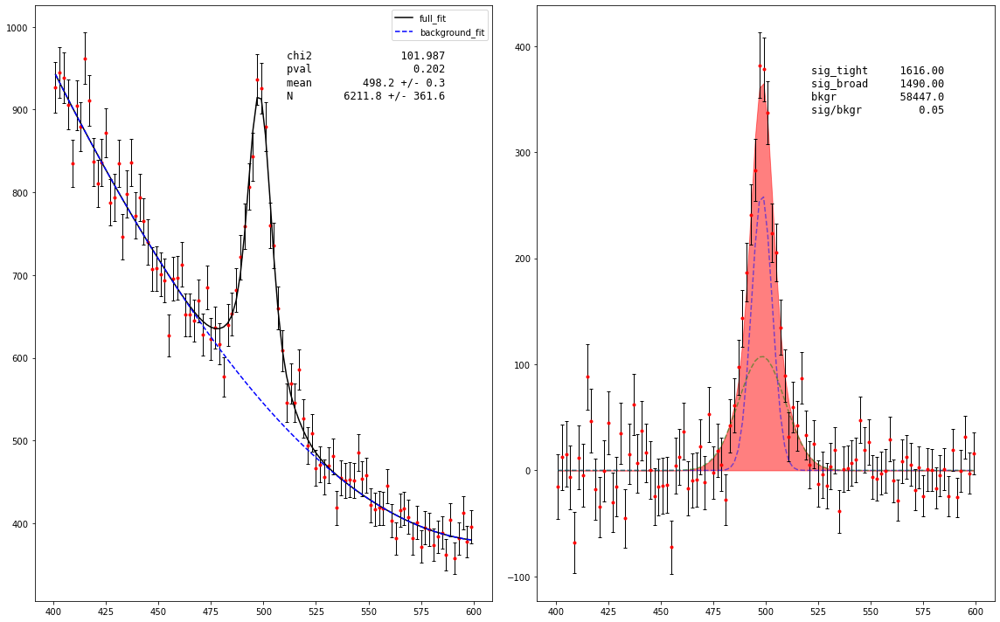

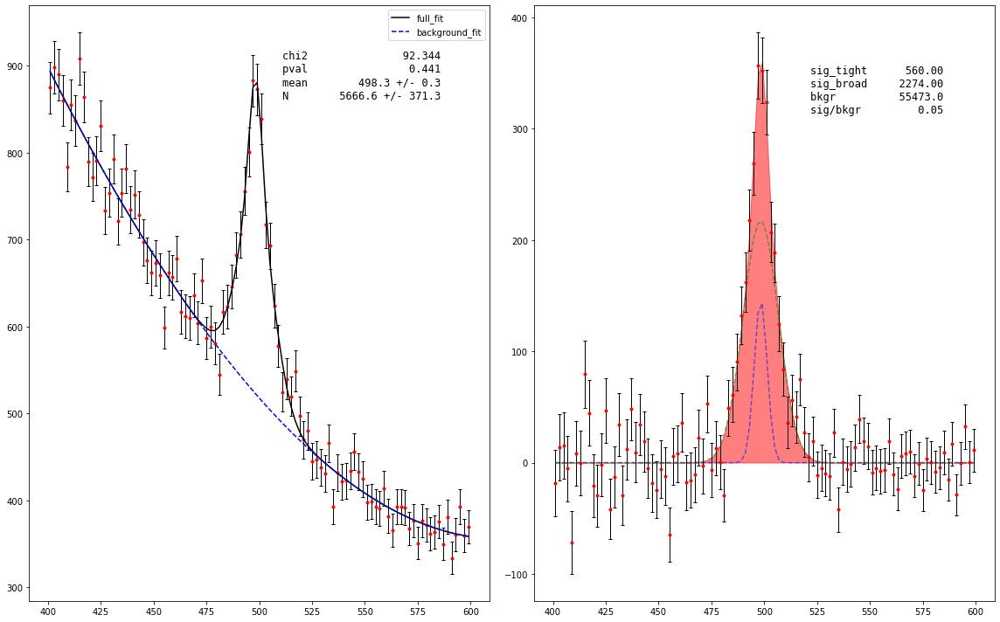

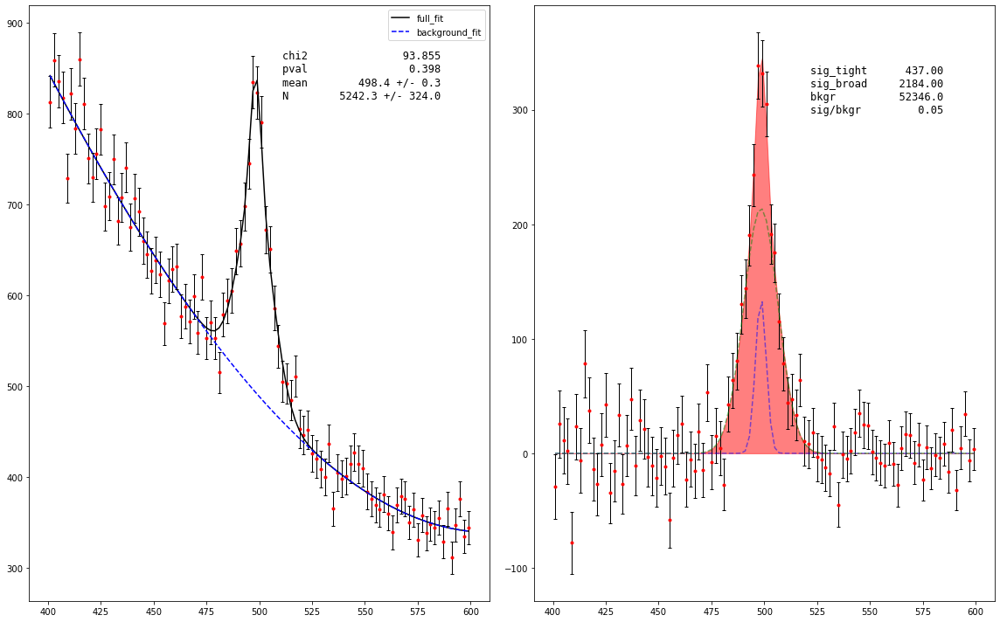

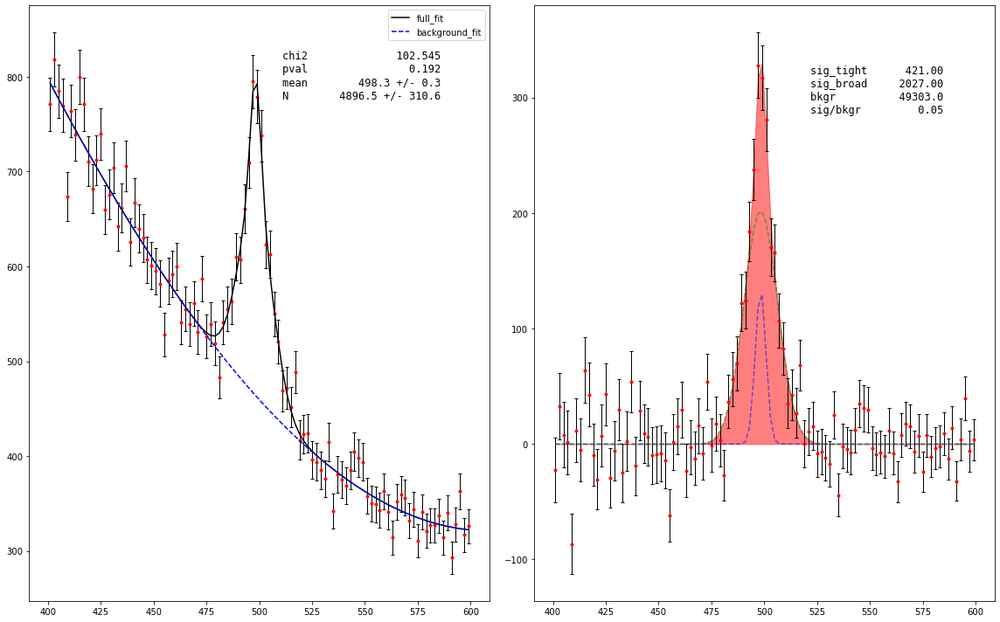

...

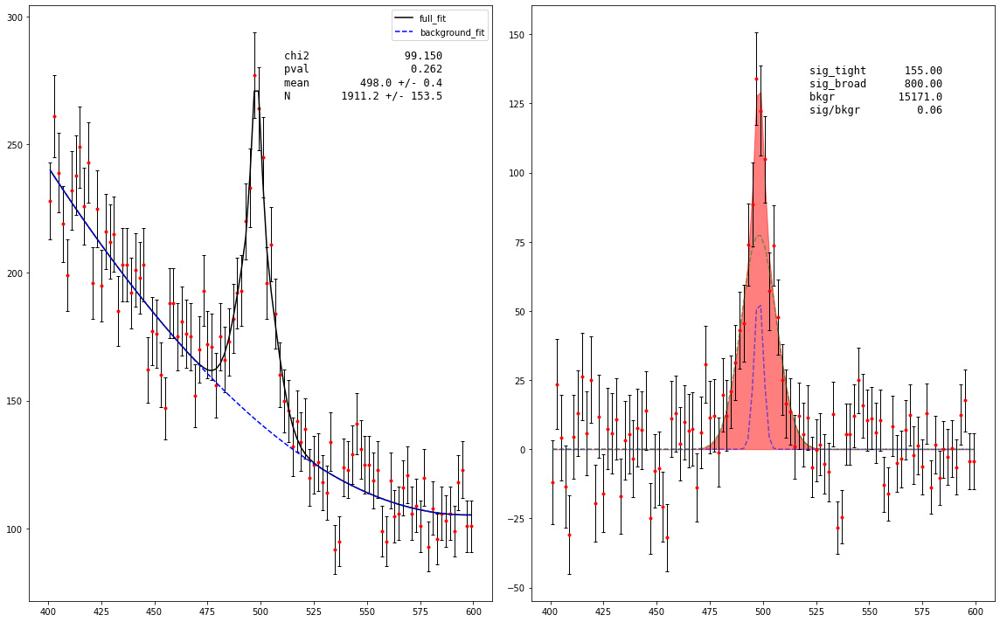

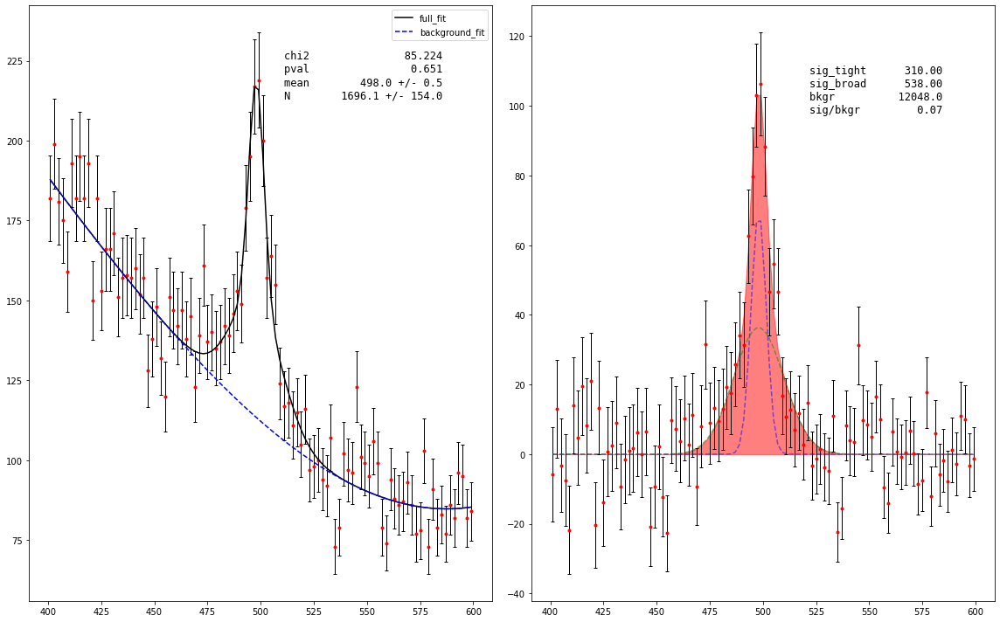

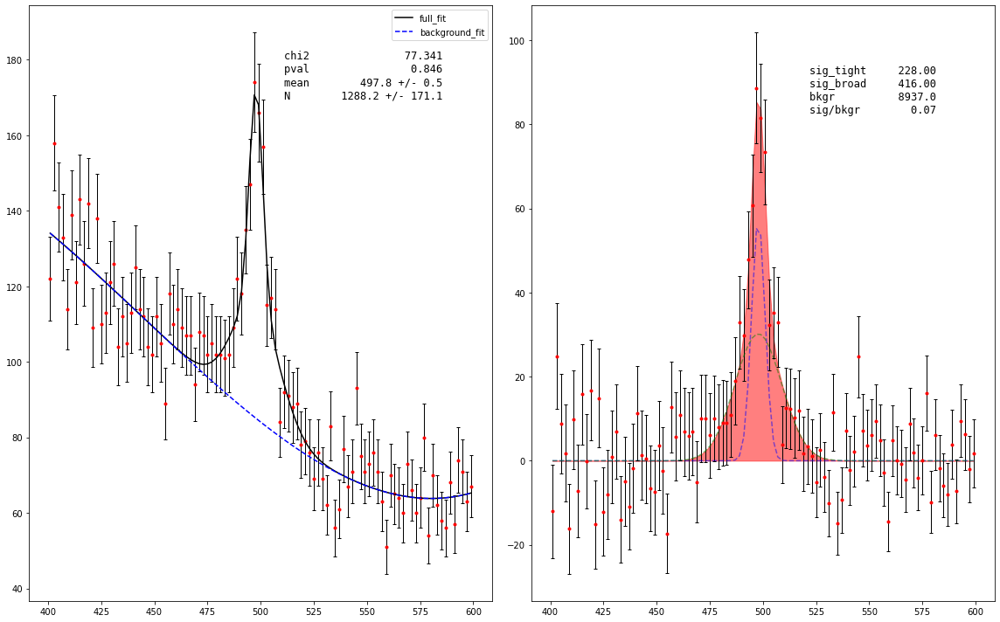

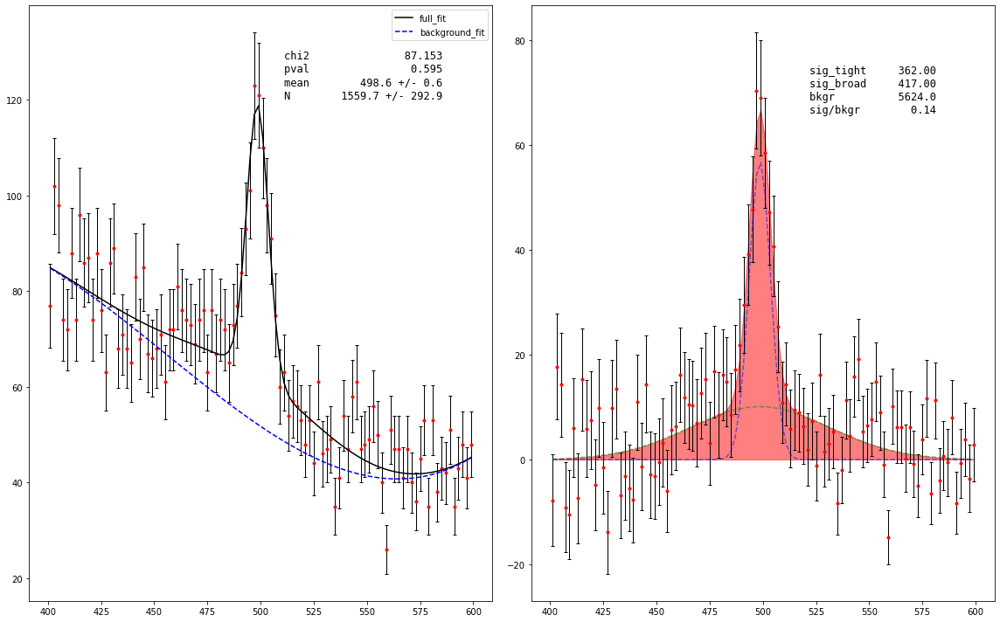

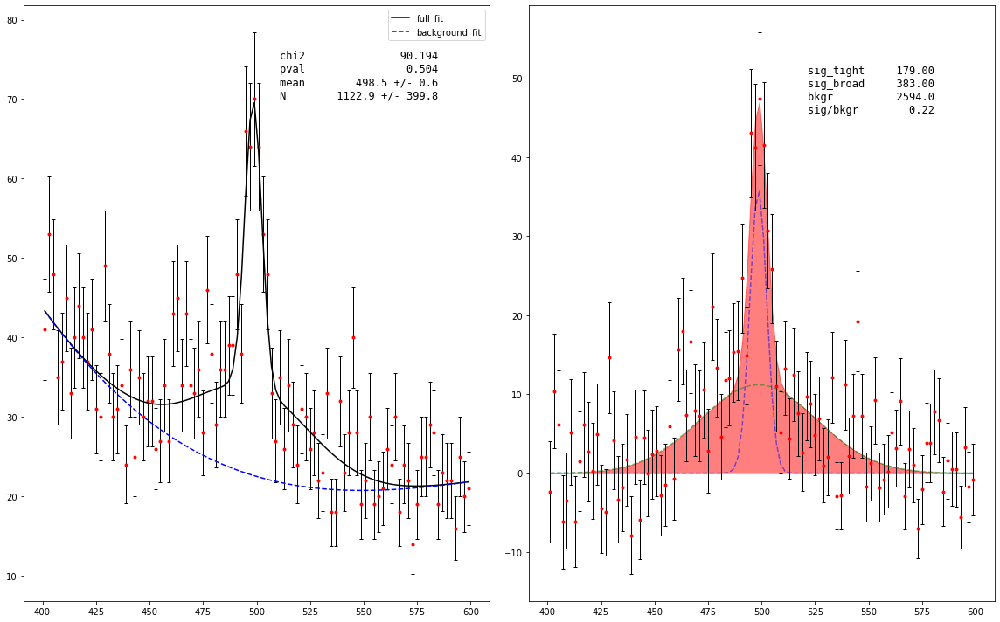

In [127]:
sXG, bXG = ROC_data_XG(test_data.v0_ks_mass, p_XG)

[Text(0.5, 1.0, 'ROC Curve for XGBoost in data: Still uncertain')]

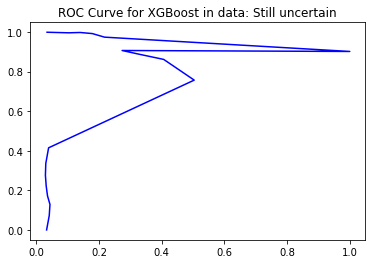

In [53]:
fig, ax = plt.subplots()
ax.plot(np.asarray(sXG)/max(sXG), 1-np.asarray(bXG)/max(bXG),'b-')
ax.set(title='ROC Curve for XGBoost in data: Still uncertain')

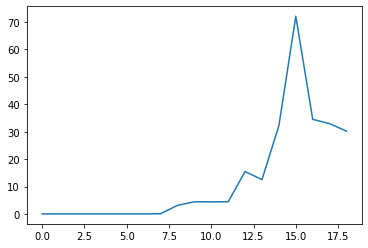

In [57]:
plt.plot(p, np.array(sXG)/np.array(bXG))
#SN/ratio som function af p

In [159]:
def ROC_data_PCA(mass, p, length=20, plot=True, label=True):
    tmp_p = np.sort(p)
    p_ranges = tmp_p[np.linspace(0,len(tmp_p)-1,length,dtype=int)]
    
    signal_count, bkgr_count = [], []
    
    mass_fig, mass_ax = plt.subplots(figsize=(16,10))
    
    for i, score in enumerate(p_ranges):
        print(i)
        y, x, _ = hm.hist(mass.loc[p<score],bins=100)
        if all(y == 0):
            continue
        
        mass_ax.plot(x,y,alpha=0.5, c='grey')
        
        if plot:
        
            fig, ax, M, signal, bkgr = fit_mass_double(x, y,np.sqrt(y),plot=True)
        else:
            M, signal, bkgr = fit_mass_double(x, y,np.sqrt(y),plot=False)
        signal_count.append(signal)
        bkgr_count.append(bkgr)
    return signal_count, bkgr_count

In [59]:
X_data=train_data_cut[train_data_cut.columns[2:-1]]
Y_data=train_data_cut.y
X_data_test=test_data[test_data.columns[2:]]

XGBClassifier()

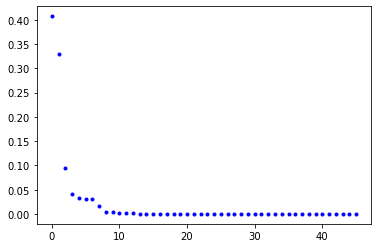

In [60]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X_data)

fig, ax = plt.subplots()
ax.plot(pca.explained_variance_ratio_,'b.')

pca = PCA(n_components=8)
model_XG.fit(pca.fit_transform(X_data), Y_data)

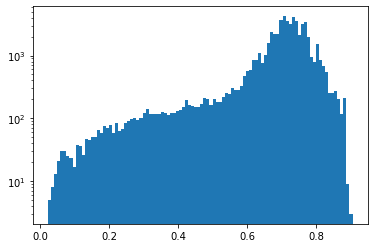

In [61]:
fig, ax = plt.subplots()
p = model_XG.predict_proba(pca.transform(X_data_test))[:,0]
ax.hist(p,bins=100);
ax.set_yscale('log')

0
1
6045.617815738465
2868.9364502031594
2
8260.231441086702
4058.446811540228
3
9135.087939751165
4696.379284043019
4
10208.752034859815
4937.93501710513
5
10603.398652361222
5302.524507246019
6
10324.087686769108
5697.847450528265
7
10216.616028537404
5726.687186998434
8
10375.342333660774
6013.90436410688
9
10226.878399241894
6217.1527881373595
10
9974.08812115547
6493.805319160525
11
10148.249909652322
6602.743572305895
12
9981.087110755288
6625.745220149691
13
9636.693361378126
6615.488828166914
14
9531.284106652474
6619.619483562796
15
9447.199163783123
6584.347238162284
16
8774.93578189714
6466.278172961122
17
8340.2047146687
6201.777908493365
18
7673.234931542327
5912.142253576015
19
6751.02634462107
5896.162992898141


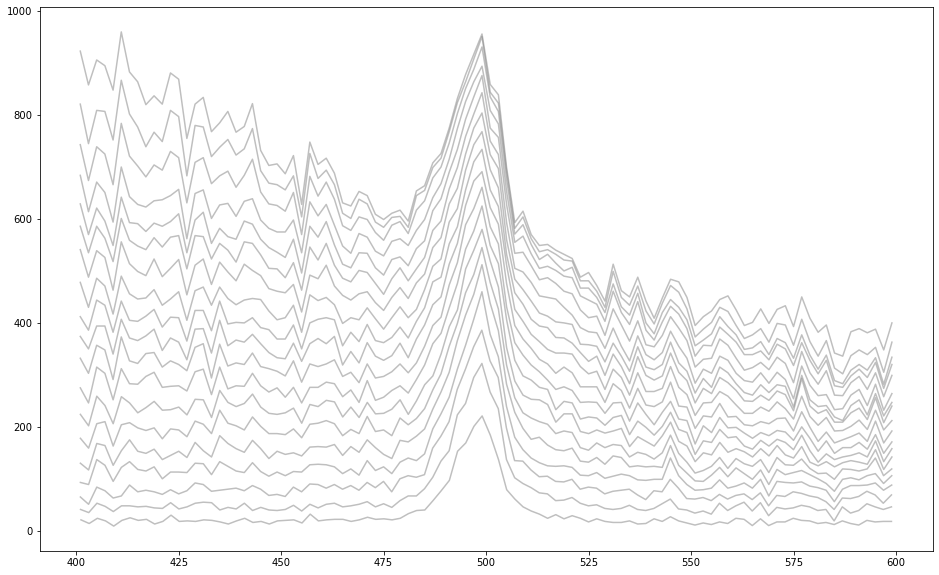

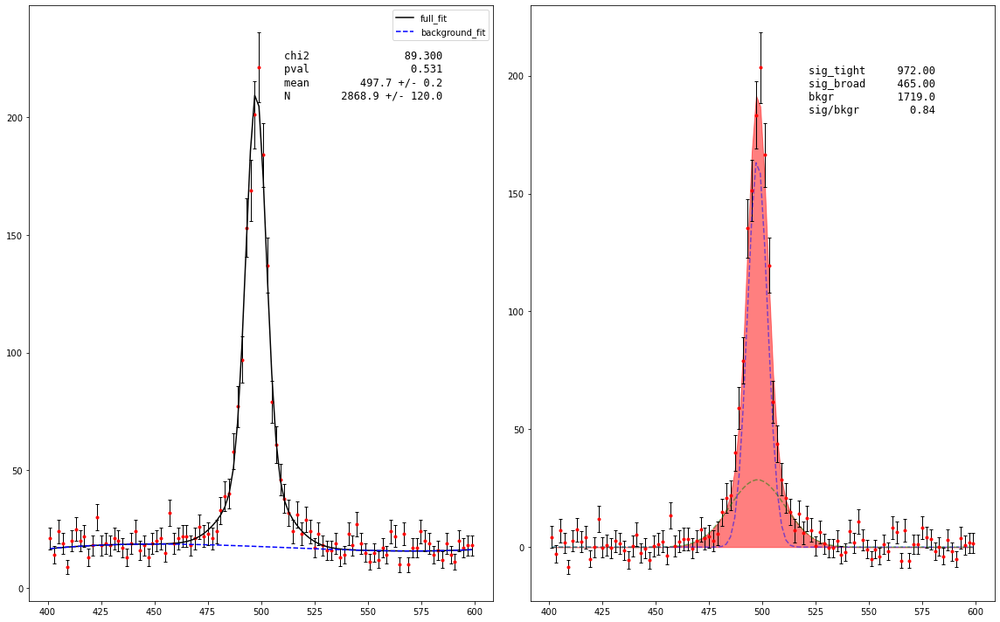

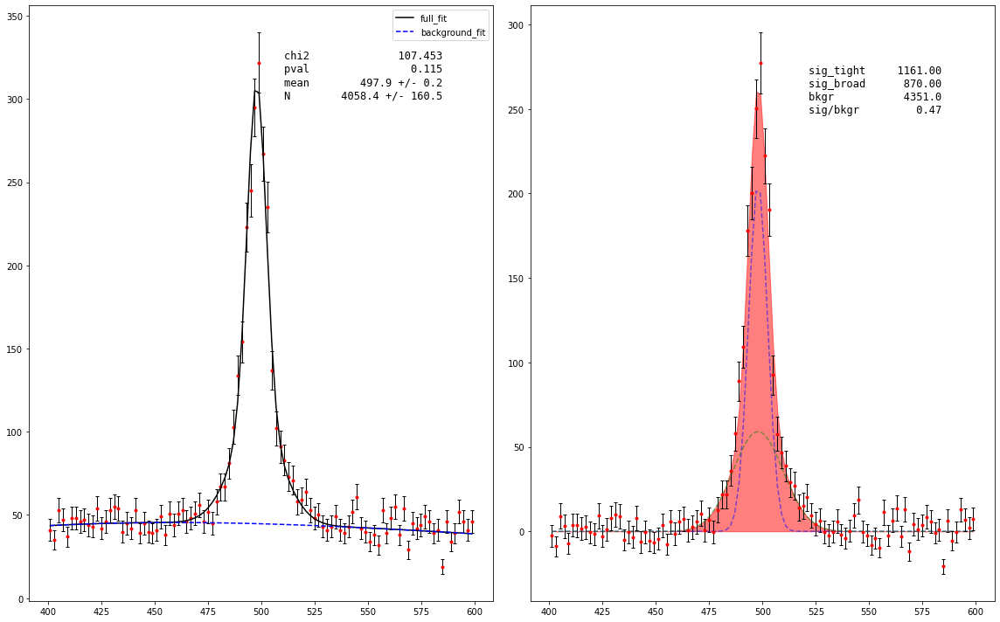

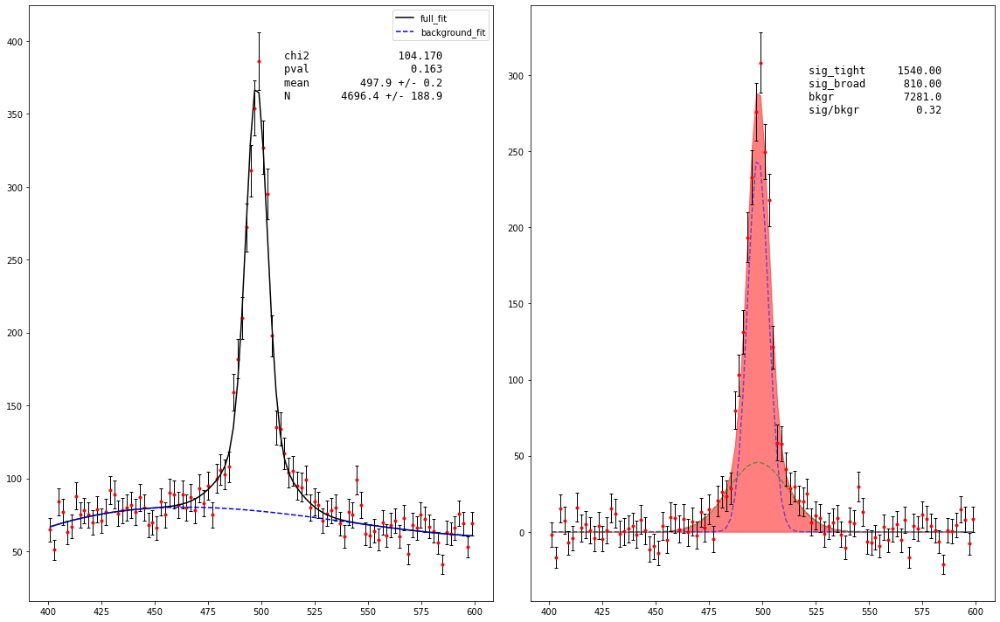

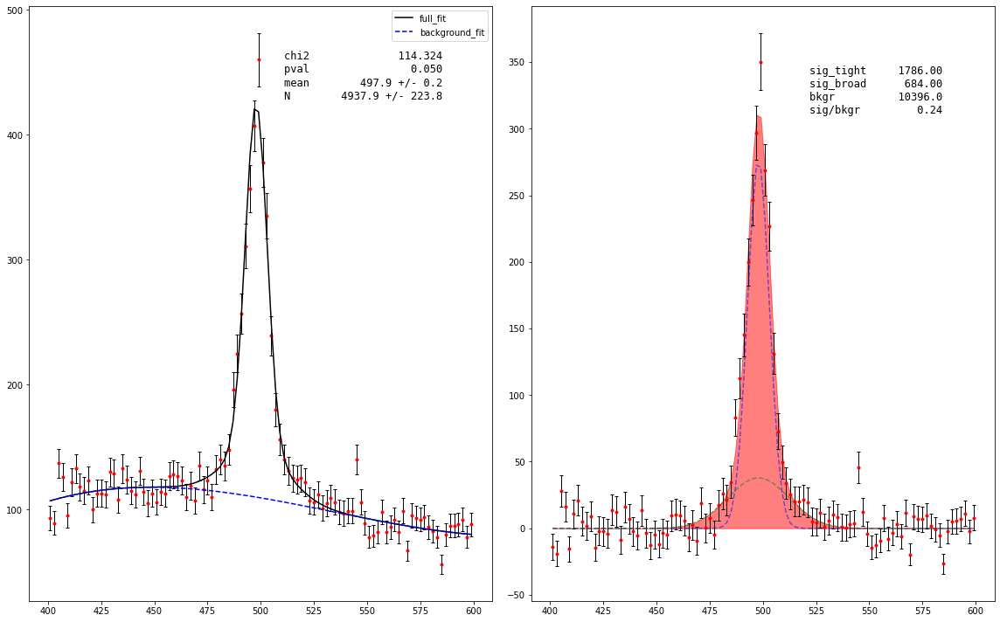

...

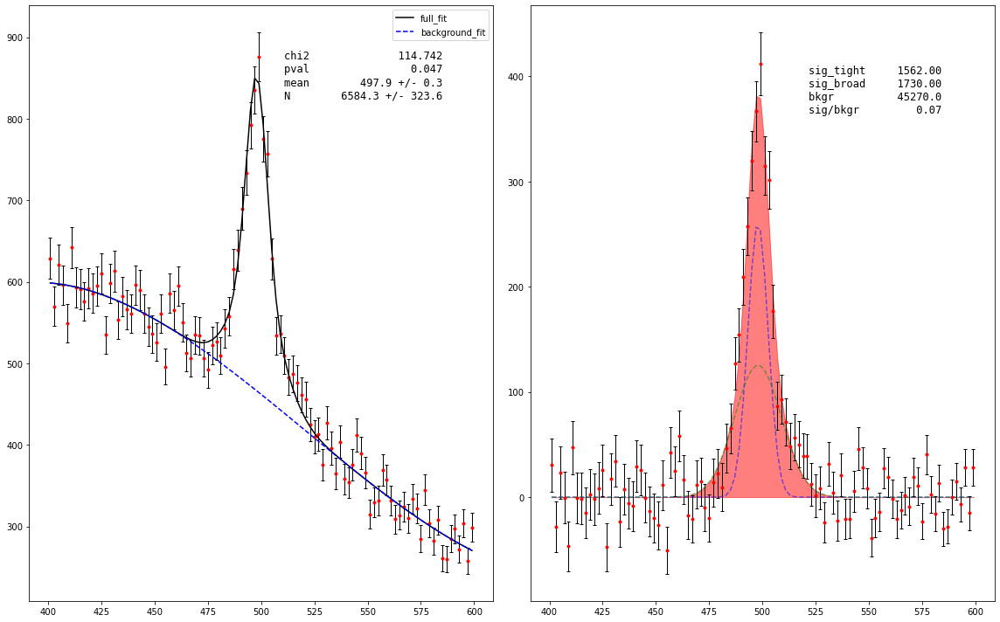

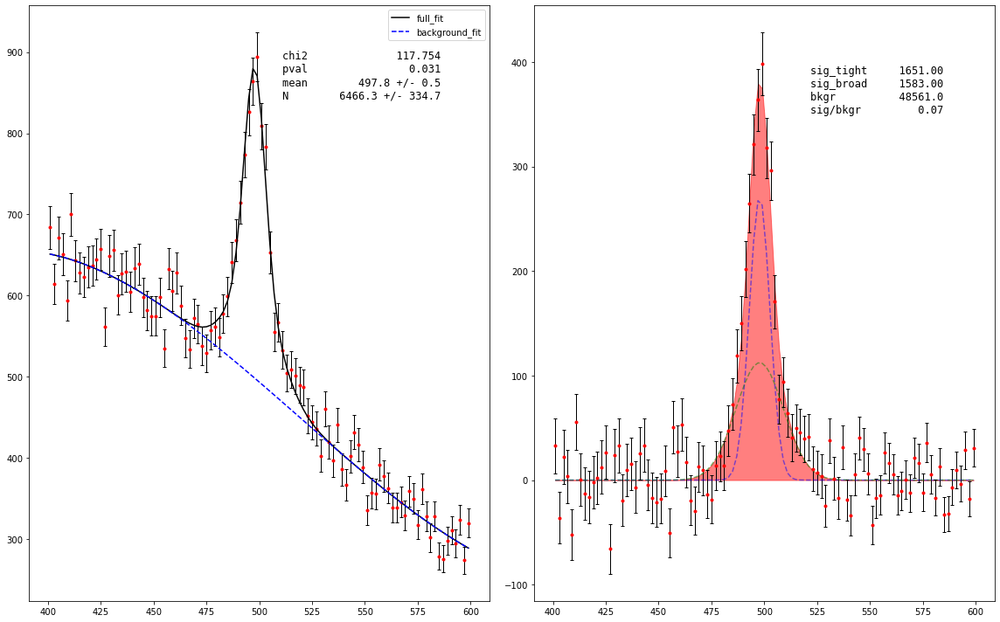

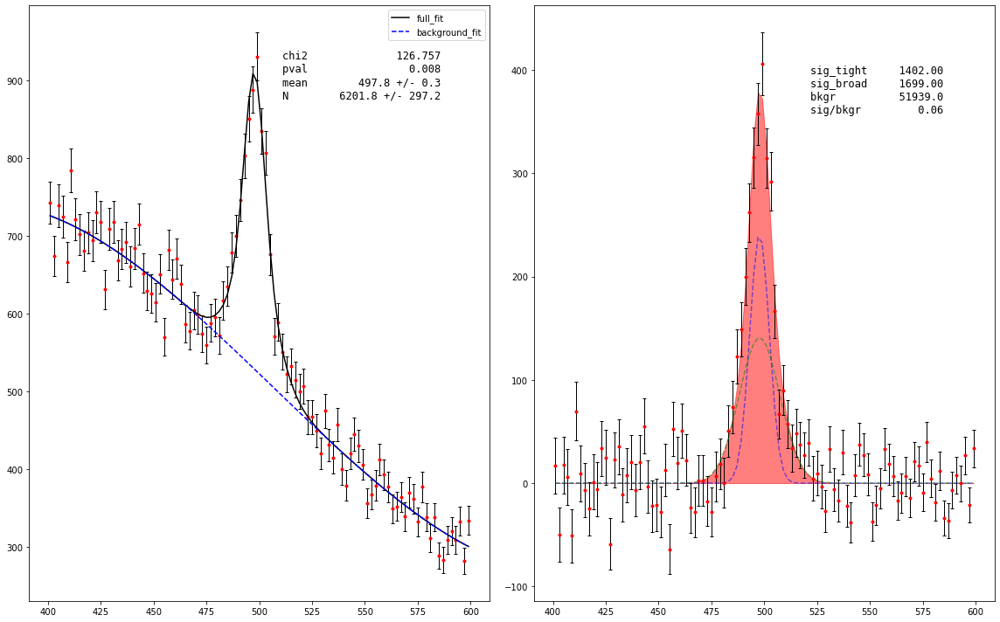

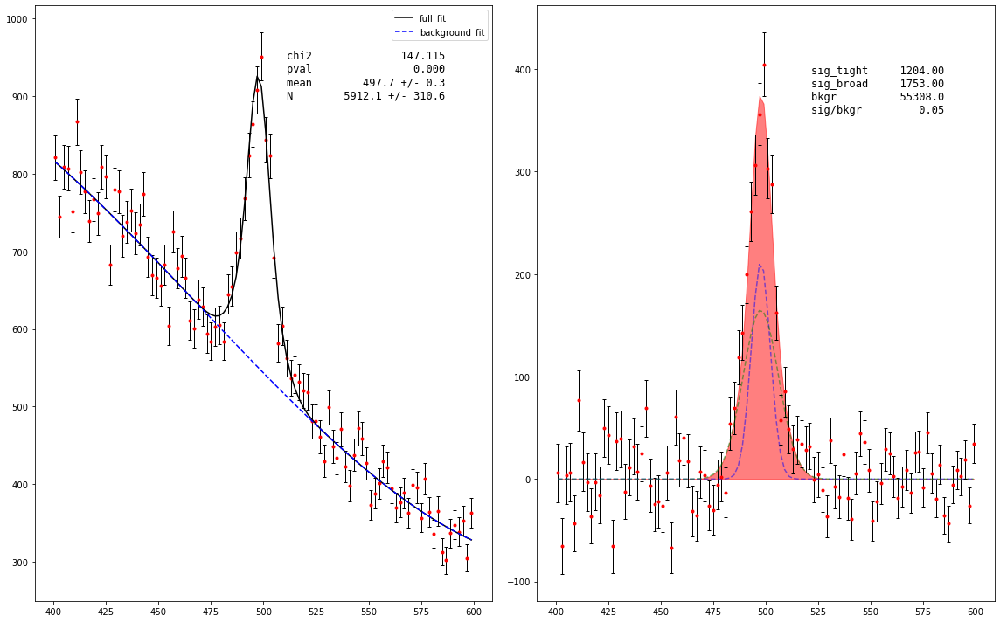

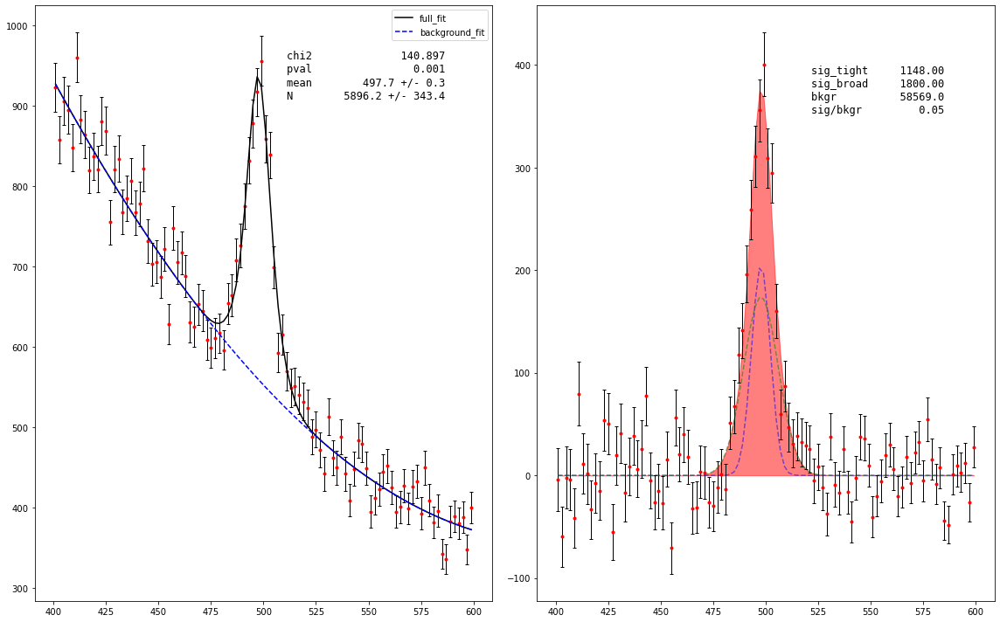

In [62]:
sPCA, bPCA = ROC_data_PCA(test_data.v0_ks_mass, p)

[Text(0.5, 1.0, 'ROC Curve for XGBoost + PCA in data: Still uncertain')]

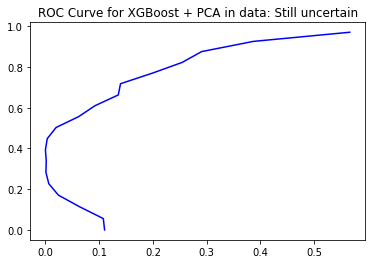

In [64]:
fig, ax = plt.subplots()
ax.plot(1-np.asarray(sPCA)/max(sPCA), 1-np.asarray(bPCA)/max(bPCA),'b-')
ax.set(title='ROC Curve for XGBoost + PCA in data: Still uncertain')

### Check MC

Now we'll do the same in MC in order to check our findings

No background valid minimum found!
101227.93650022916
59053.07280080747


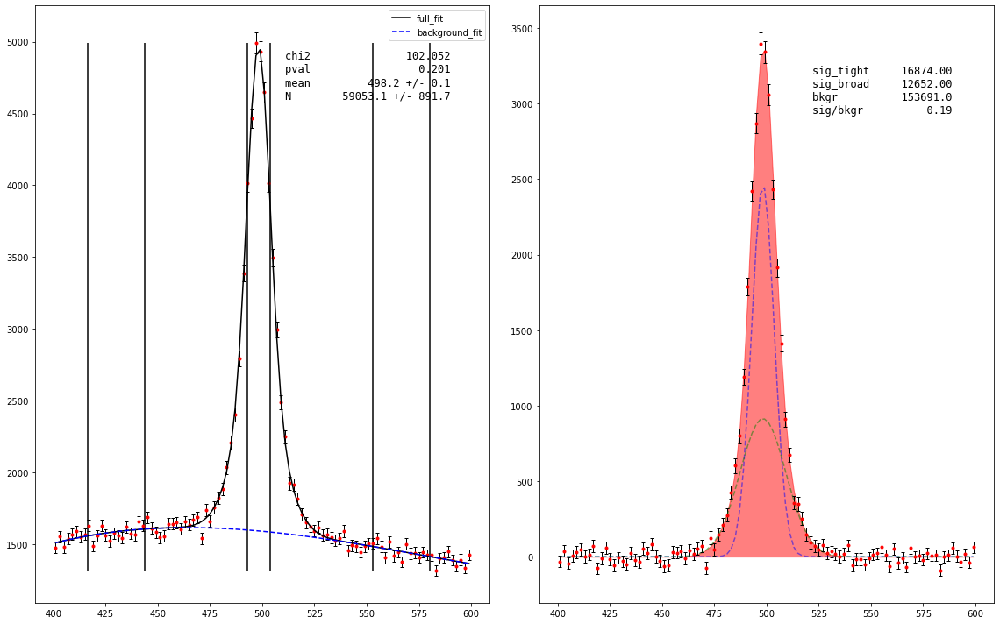

In [70]:
vals, binc, binw = hm.hist(train_mc.v0_ks_mass,bins=100)
fig, ax, M, sig, bkgr = fit_mass_double(binc,vals,np.sqrt(vals))

mean, sigma = M.values['mean'], M.values['sig']
signal = train_mc.loc[(train_mc.v0_ks_mass > mean - sigma) & (train_mc.v0_ks_mass < mean + sigma)]
bkgr_l = train_mc.loc[(train_mc.v0_ks_mass > mean - 15*sigma) & (train_mc.v0_ks_mass < mean - 10*sigma)]
bkgr_r = train_mc.loc[(train_mc.v0_ks_mass > mean + 10*sigma) & (train_mc.v0_ks_mass < mean + 15*sigma)]
ax[0].vlines([mean-sigma,mean+sigma,mean-15*sigma,mean-10*sigma,mean+10*sigma,mean+15*sigma],min(vals),max(vals))

min_sample = min([len(signal),len(bkgr_l),len(bkgr_r)])
# if min_sample != len(signal):print("WARNING! increase background samplesize or increase signal sample-size")


train_mc_cut = pd.concat([signal.sample(min_sample),
                   bkgr_l.sample(min_sample),
                   bkgr_r.sample(min_sample)])
train_mc_cut['y'] = np.append(np.ones(min_sample),[np.zeros(min_sample),np.zeros(min_sample)])

In [84]:
X_mc=train_mc_cut[train_mc_cut.columns[2:-2]]
Y_mc=train_mc_cut.y
X_mc_test=test_mc[test_mc.columns[2:-1]]
Y_mc_test=test_mc.trueKs

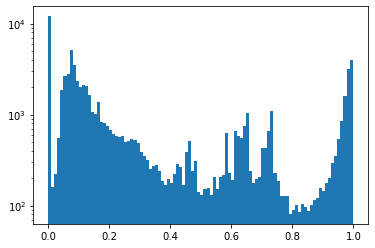

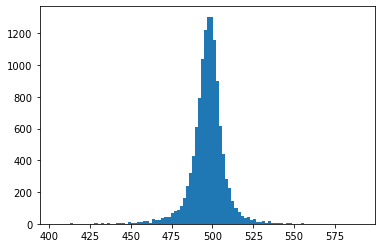

In [88]:
model_XG=XGBClassifier()
setattr(model_XG, 'verbosity', 1)
model_XG.fit(X_mc, y=Y_mc)
p_XG = model_XG.predict_proba(X_mc_test)[:,1]
fig, ax = plt.subplots()
ax.hist(p_XG,bins=100);
ax.set_yscale('log')
fig, ax = plt.subplots()
ax.hist(test_mc.loc[p_XG>0.8].v0_ks_mass,bins=100);

0
42890.726845257246
25096.034622868112
1
42783.866676182435
26875.423980333908
2
42689.43859377941
28830.03861834093
3
42692.69537868485
28412.22914559317
4
43432.16001475036
25127.801879303915
5
No background valid minimum found!
45214.53920697062
24725.328833495812
6
49692.79307117457
No valid double gaussian minimum found after 250 tries!
186736.0624133495
7
54004.78998229079
154629.8211438403
8
55424.85107633606
107443.15272200243
9
55048.18786028772
92572.72133194712
10
54830.253684535135
70274.992879614
11
54182.509625217215
59122.43836825206
12
53414.631094708144
53452.133235935915
13
52723.38095119147
47818.19374835711
14
51133.161067600886
39529.032799852255
15
47988.476381288805
31770.87962527776
16
39212.188795146314
22584.13521448057
17
16367.394399851648
8058.855289849668
18
6150.633433418986
2694.7550064377747
19


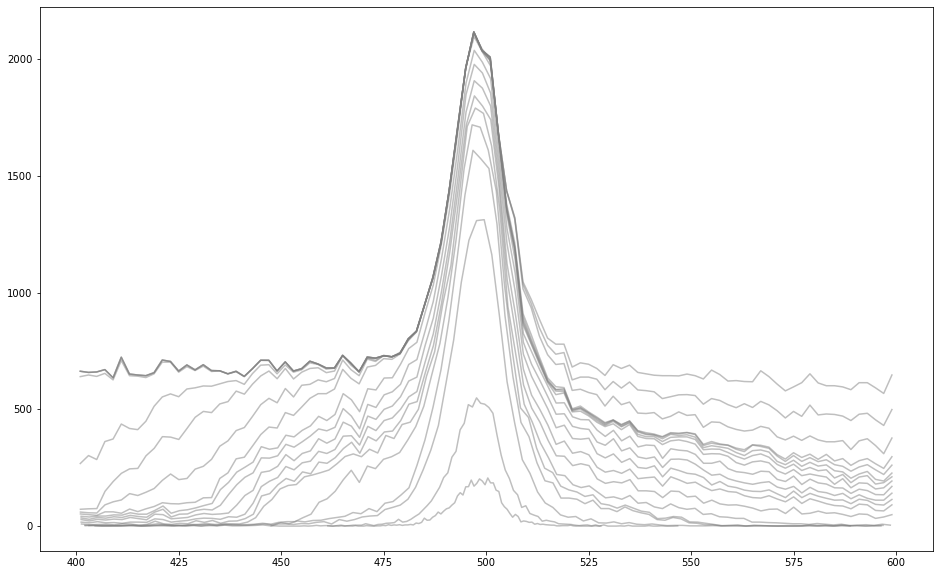

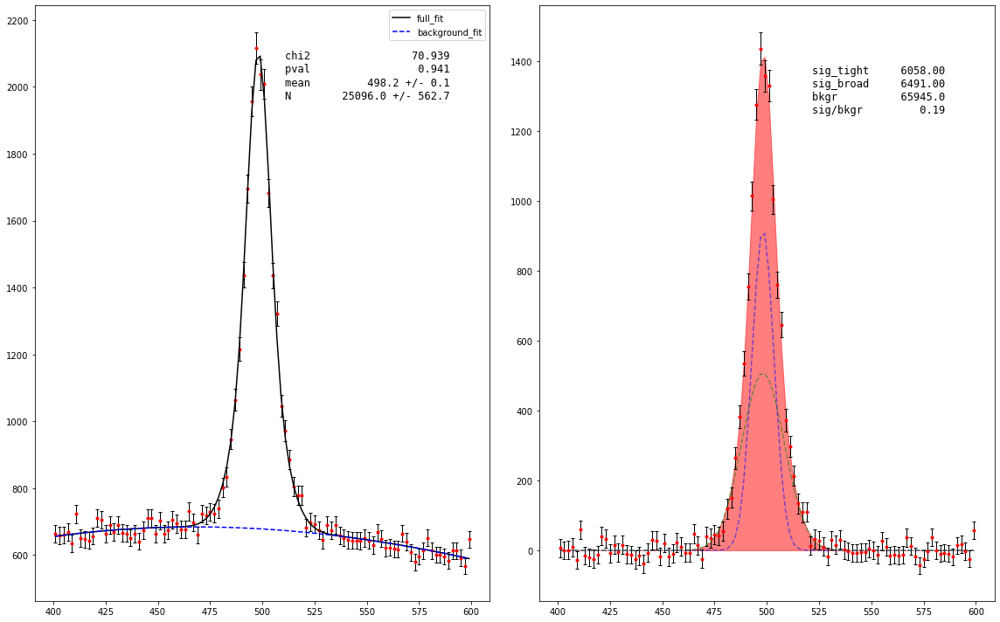

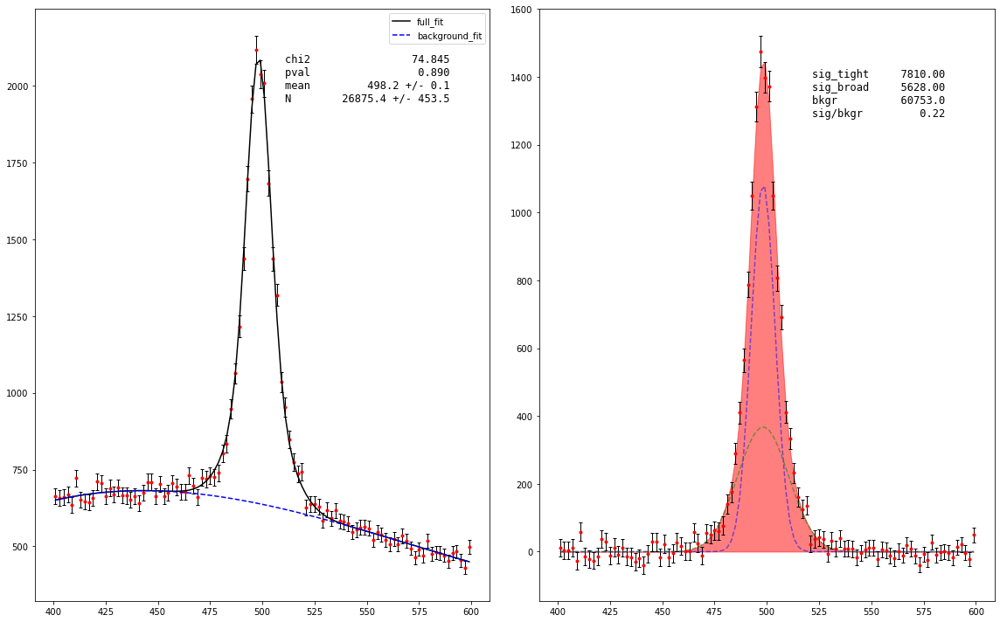

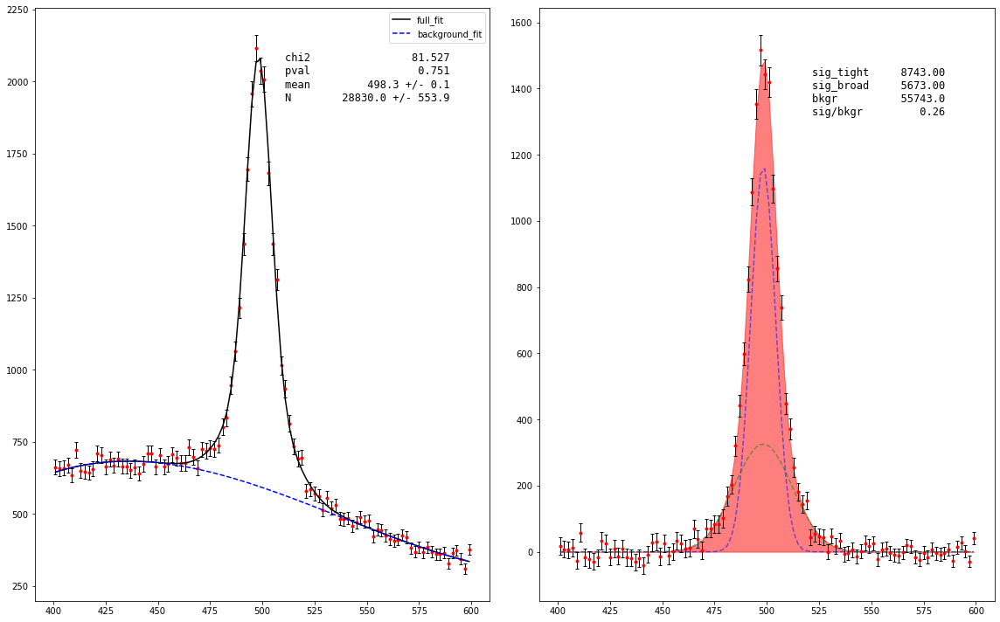

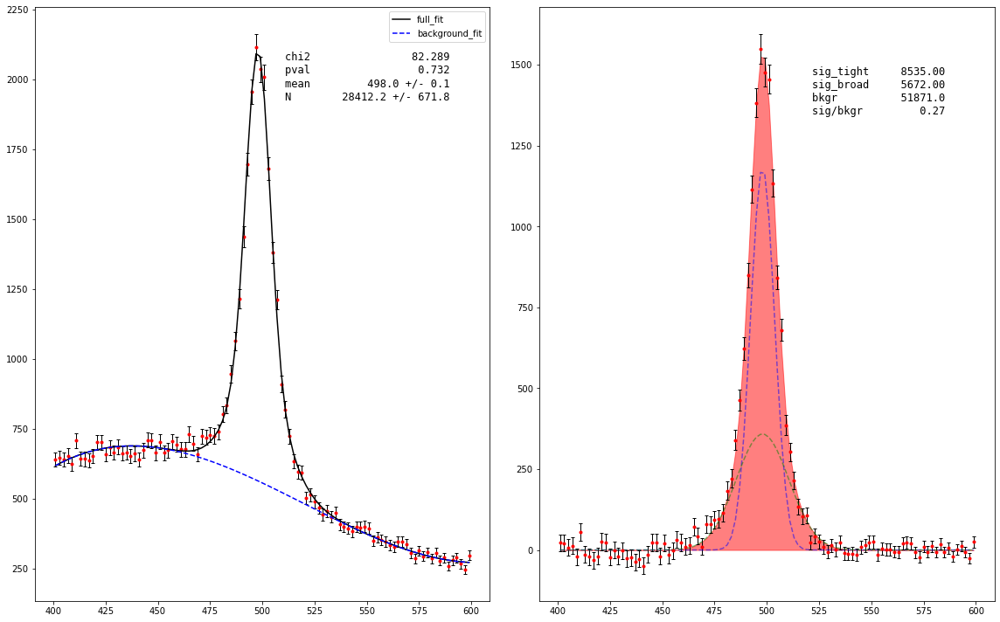

...

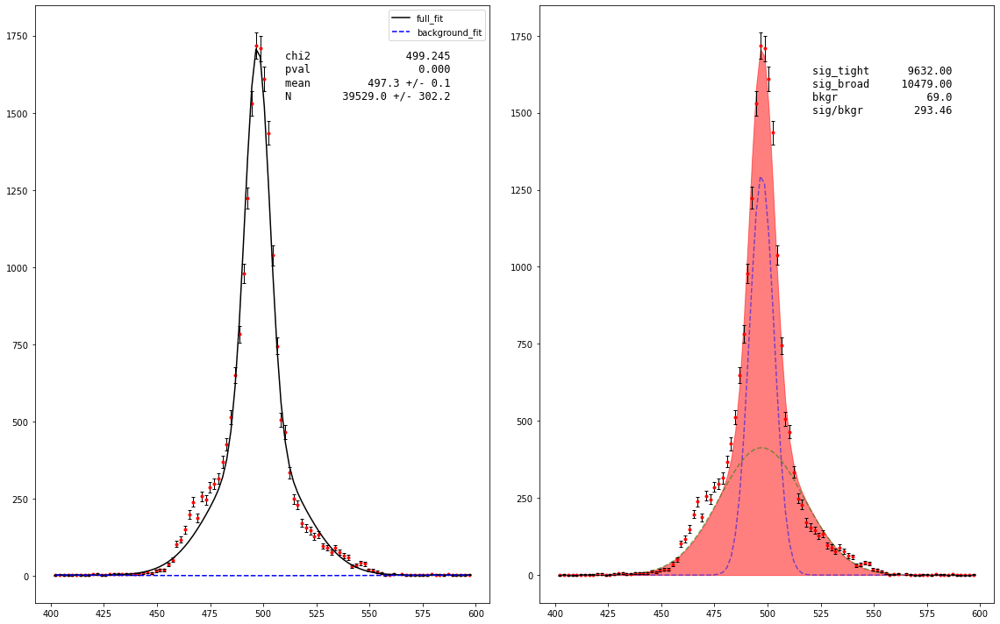

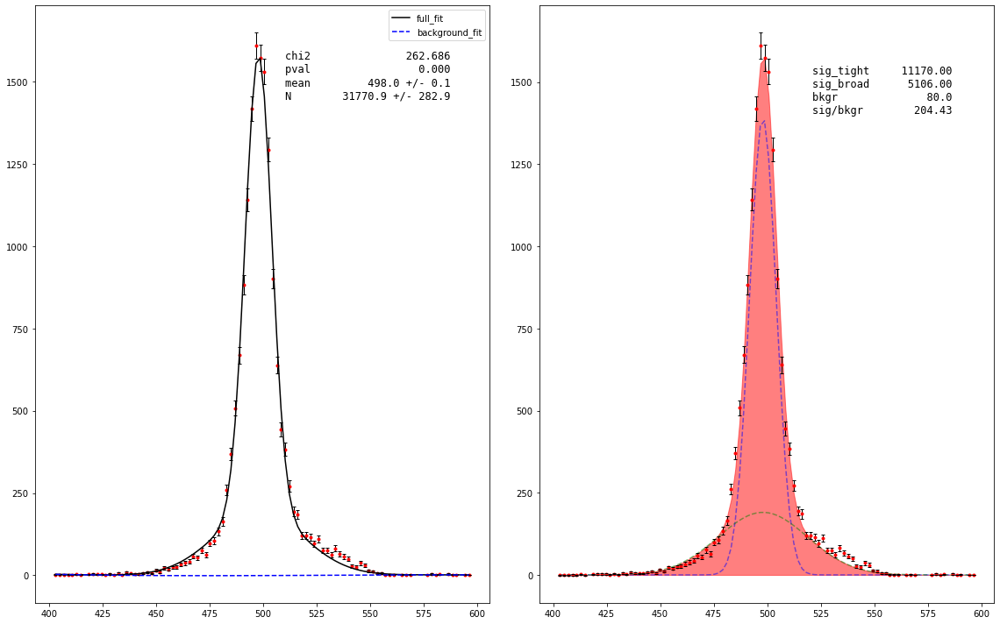

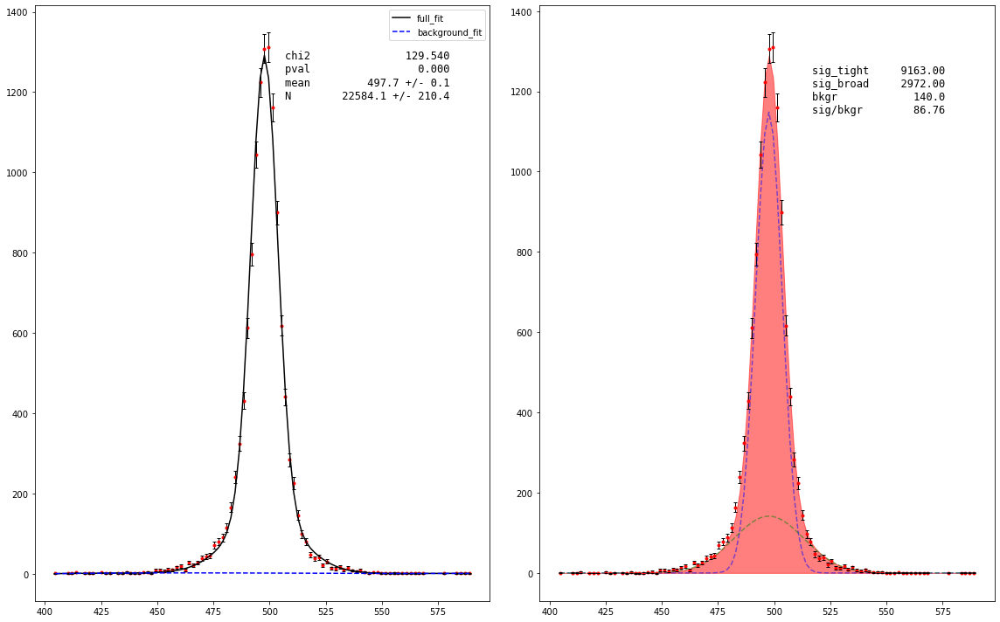

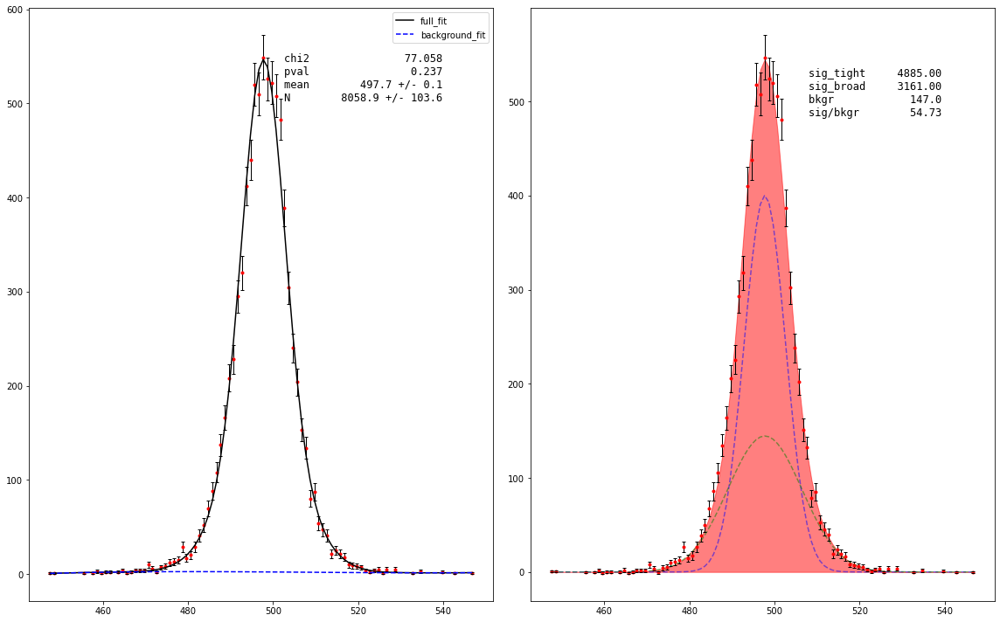

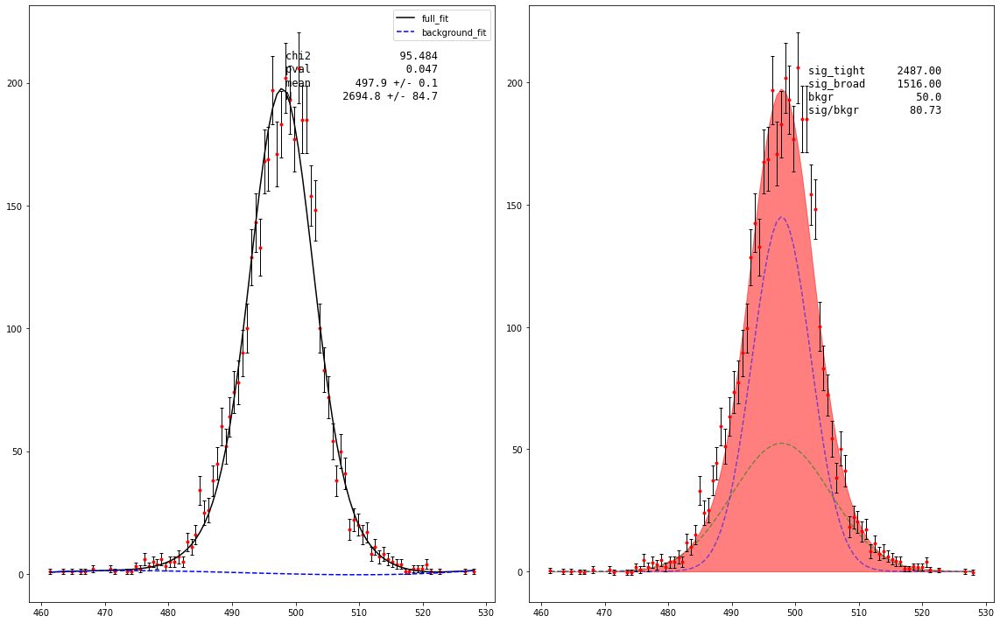

In [89]:
sXG, bXG = ROC_data_XG(test_mc.v0_ks_mass, p_XG)

[Text(0.5, 1.0, 'ROC Curve for XGBoost in MC')]

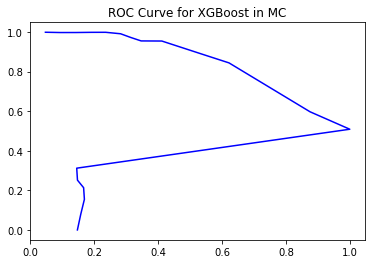

In [98]:
fig, ax = plt.subplots()
ax.plot(np.asarray(sXG)/max(sXG), 1-np.asarray(bXG)/max(bXG),'b-')
ax.set(title='ROC Curve for XGBoost in MC')

XGBClassifier()

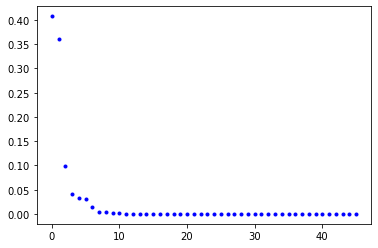

In [91]:
pca = PCA()
pca.fit(X_mc)

fig, ax = plt.subplots()
ax.plot(pca.explained_variance_ratio_,'b.')

pca = PCA(n_components=8)
model_XG.fit(pca.fit_transform(X_mc), Y_mc)

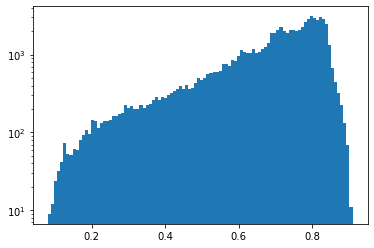

In [93]:
fig, ax = plt.subplots()
p = model_XG.predict_proba(pca.transform(X_mc_test))[:,0]
ax.hist(p,bins=100);
ax.set_yscale('log')

0
1
10247.447680649144
4827.060871924292
2
17381.803876884383
8111.902608463534
3
21738.666309902037
10617.94154377323
4
25192.833727417332
12728.9707833507
5
28035.628706082825
14657.066203931683
6
30988.683126789394
16607.655071829424
7
32954.098987181664
17995.642642729516
8
34965.5910137944
19221.47104963303
9
No background valid minimum found!
36577.92787872964
20280.15698628469
10
37761.43116327186
21187.84937195565
11
39079.28429400999
21982.294338080133
12
39729.844343976525
22723.321720868553
13
40407.255444839044
23428.01510195757
14
41313.40623464841
23698.155118228344
15
41530.94446629143
24136.55033333576
16
41690.79359268575
24439.890239012024
17
41555.67406616094
24791.908985172107
18
No background valid minimum found!
41991.7188524024
25043.663469114923
19
42891.968662425046
25094.423433864355


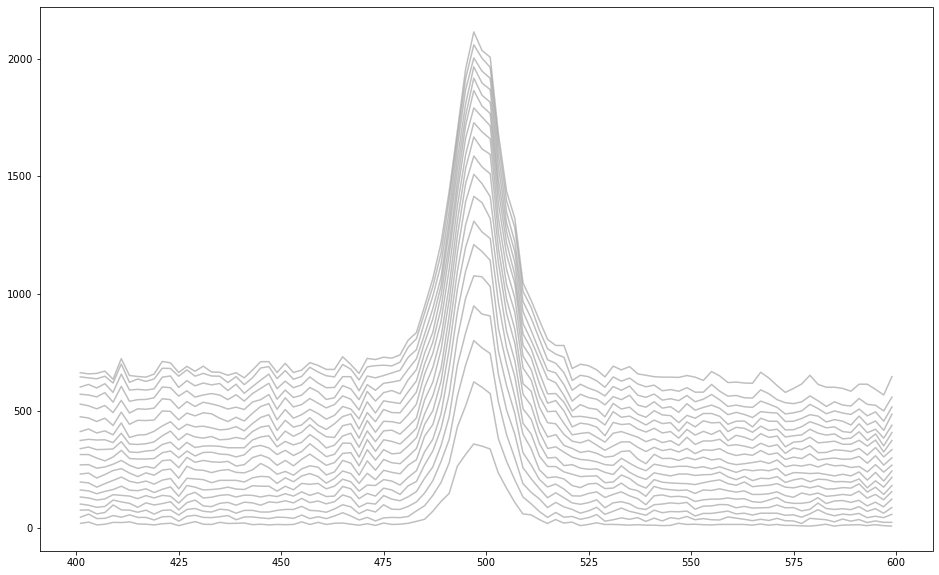

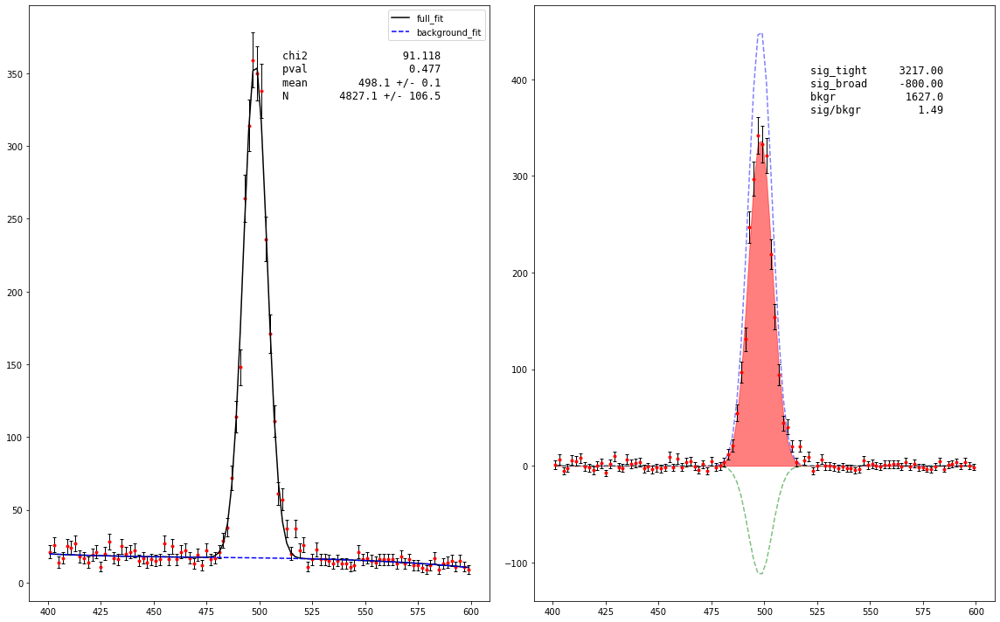

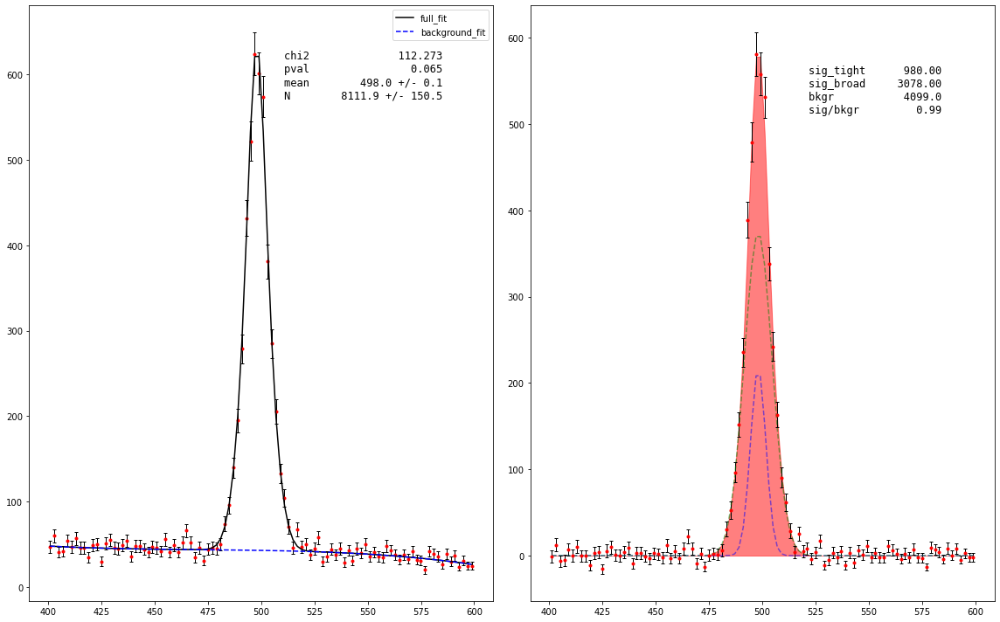

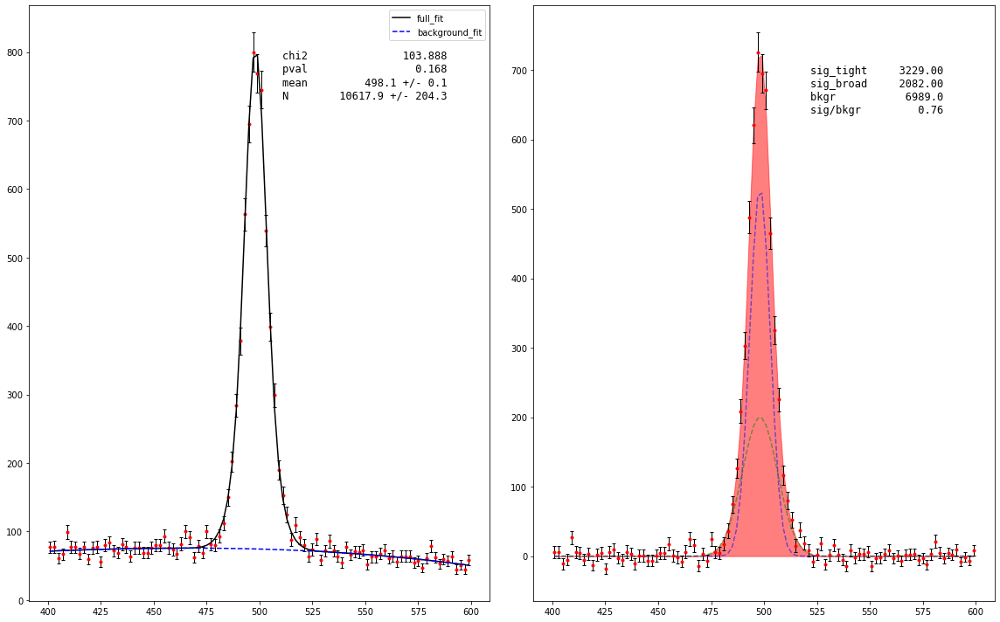

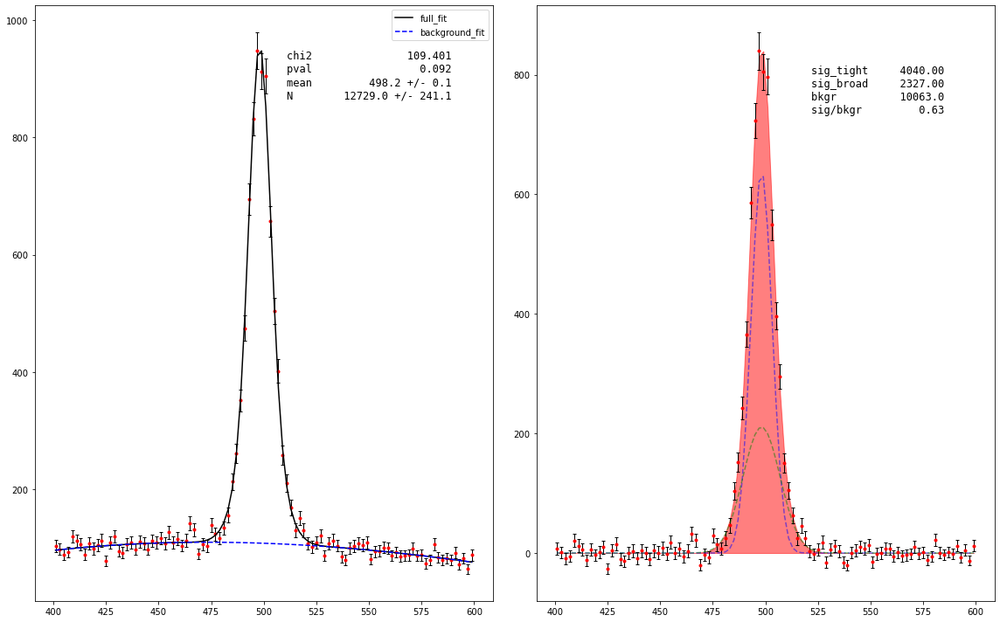

...

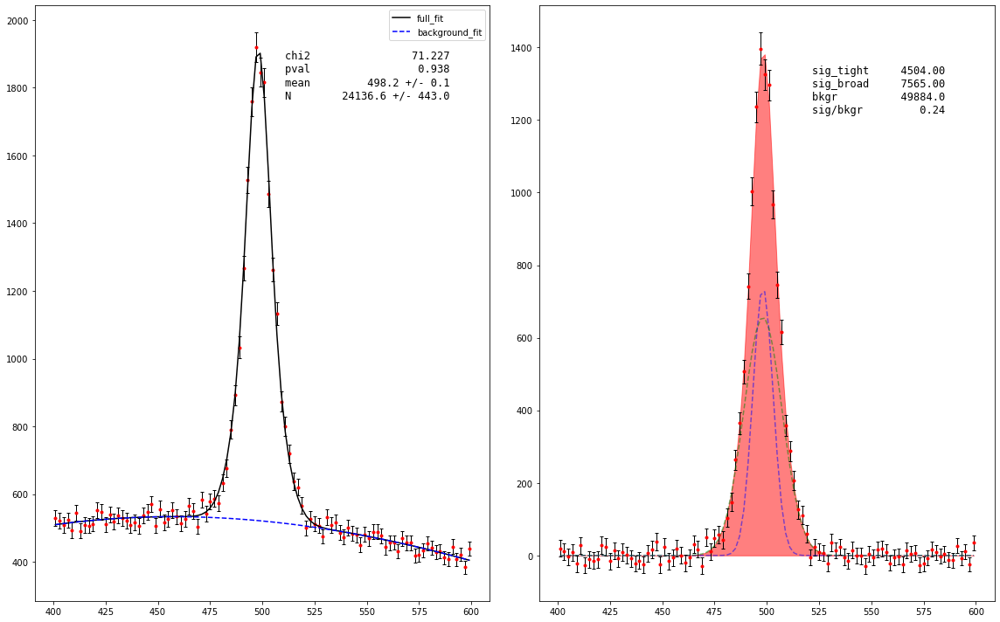

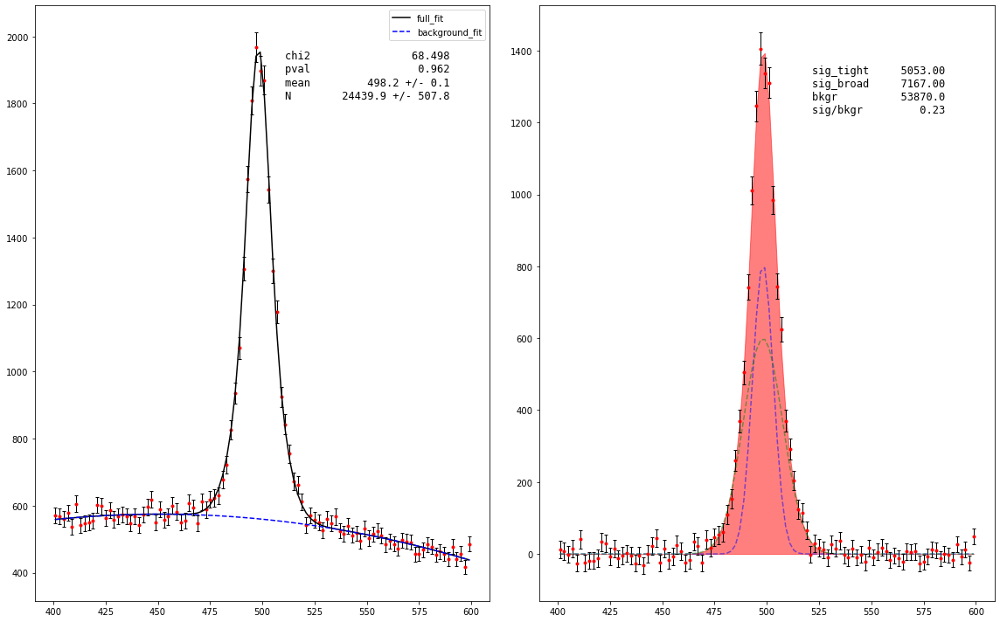

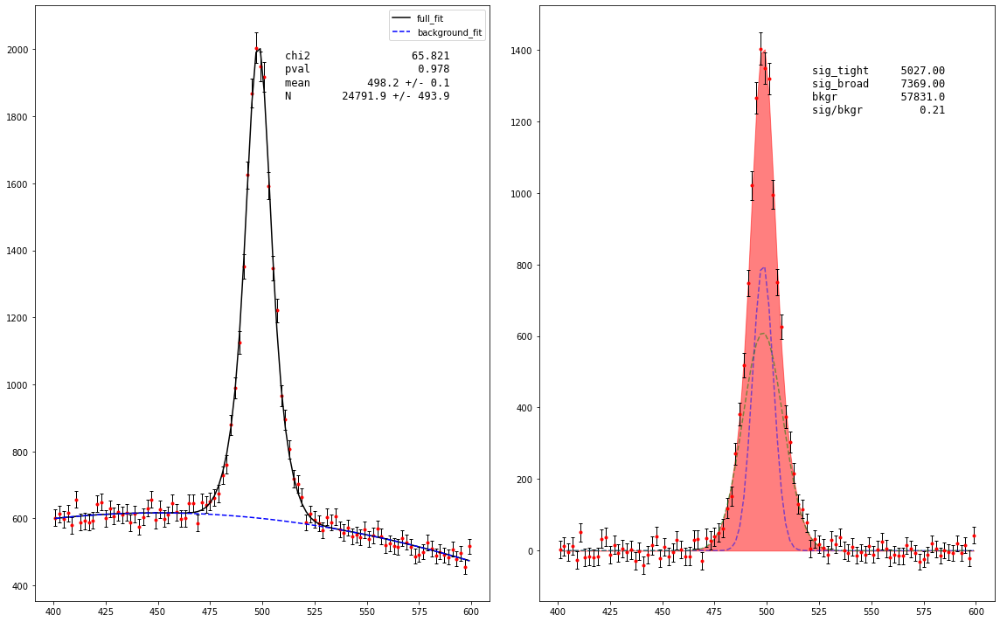

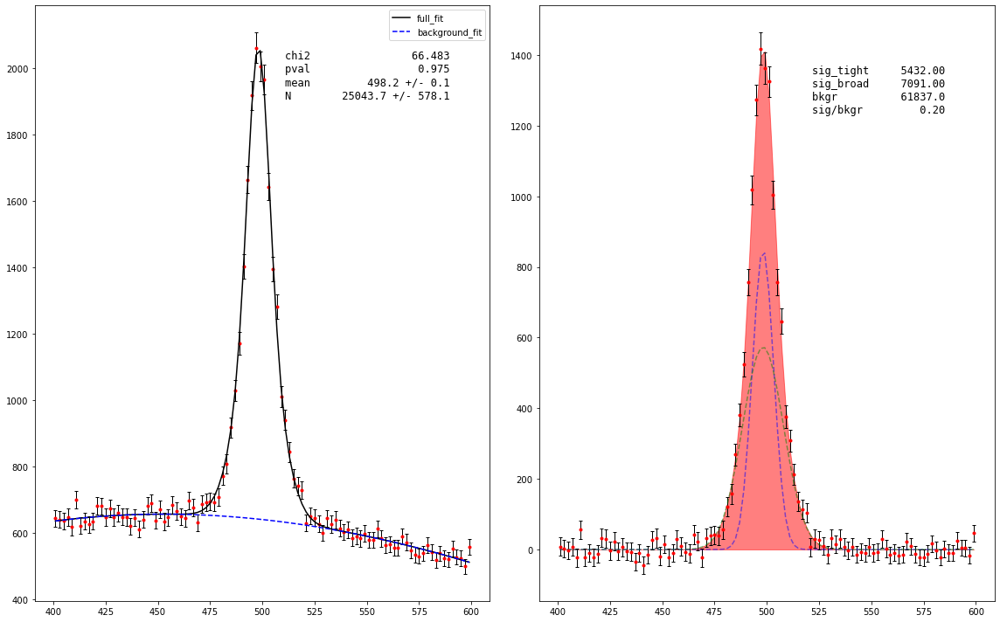

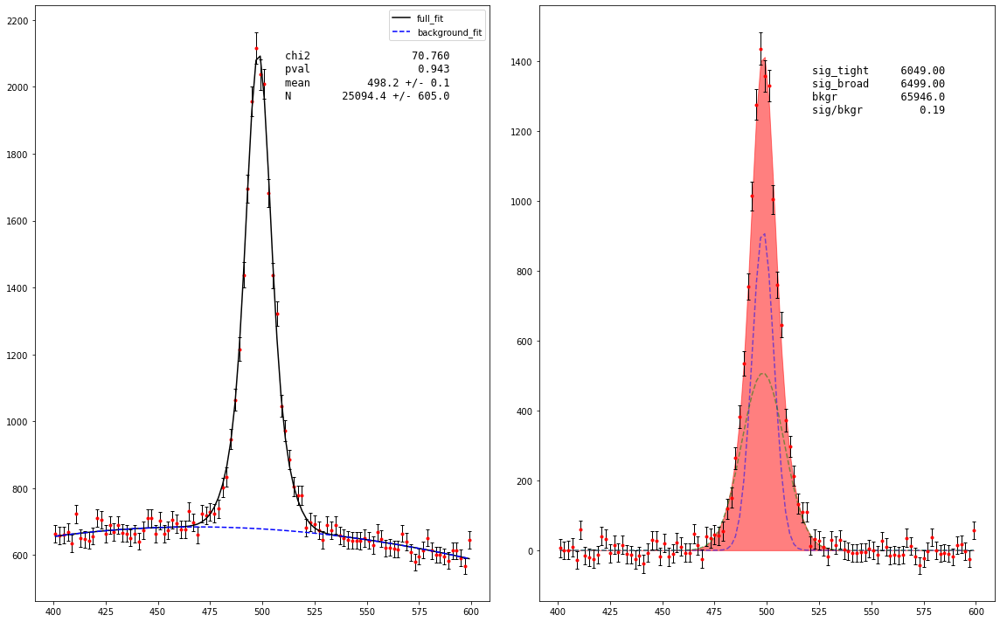

In [94]:
sPCA, bPCA = ROC_data_PCA(test_mc.v0_ks_mass, p)

[Text(0.5, 1.0, 'ROC Curve for XGBoost + PCA in MC: Looks very good')]

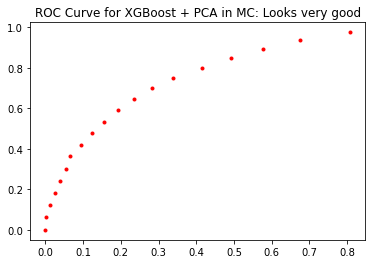

In [99]:
fig, ax = plt.subplots()
ax.plot(1-np.asarray(sPCA)/max(sPCA), 1-np.asarray(bPCA)/max(bPCA),'r.')
ax.set(title='ROC Curve for XGBoost + PCA in MC: Looks very good')

0.7599057610620407


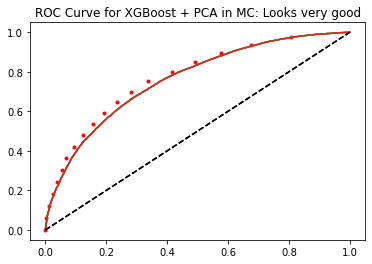

In [103]:
from sklearn.metrics import roc_curve, roc_auc_score
a = roc_curve(test_mc.trueKs,p)
ax.plot(a[1],a[0])
ax.plot(np.linspace(0,1,100), np.linspace(0,1,100), 'k--')
print(1-roc_auc_score(test_mc.trueKs, p))
fig

## Cross-matching
Now let's try to do to the cross-matching, data trained in MC and MC trained in data

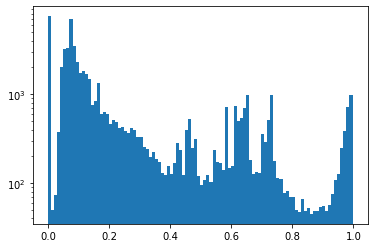

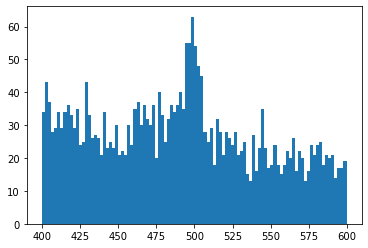

In [111]:
# First train in MC test data
model_XG=XGBClassifier()
setattr(model_XG, 'verbosity', 1)
model_XG.fit(X_mc, y=Y_mc)
p_XG = model_XG.predict_proba(X_data_test)[:,1]
fig, ax = plt.subplots()
ax.hist(p_XG,bins=100);
ax.set_yscale('log')
fig, ax = plt.subplots()
ax.hist(test_data.loc[p_XG>0.9].v0_ks_mass,bins=100);

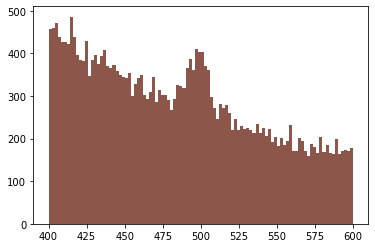

In [119]:
ax.hist(test_data.loc[p_XG<0.1].v0_ks_mass,bins=100);
fig
##this is pretty bad, loads of misclassification

0
6075.757594984771
6211.758236931003
1
5615.418793372327
5666.598858251066
2
5355.077739232349
5241.943328223777
3
5312.035335876184
4896.519003940159
4
5254.608051903751
4497.177320879887
5
4882.422765615589
4387.550949016855
6
4855.657737428208
4154.4891546883355
7
4630.797930878973
4115.146881410824
8
4575.047266169573
3649.535697953558
9
4325.382208169217
3484.848026772388
10
4302.207096535093
3185.5768542696946
11
3856.998383265648
3010.496931032392
12
3268.166052671413
2717.8581251194696
13
3003.4693428185906
2431.508333090662
14
2720.33151198345
1911.183904322535
15
2094.0649280457496
1696.0993147057527
16
1899.2398600960812
1288.2351693150147
17
1483.9004537954893
1559.7013322519952
18
1111.4016957135434
1122.9039522634978
19


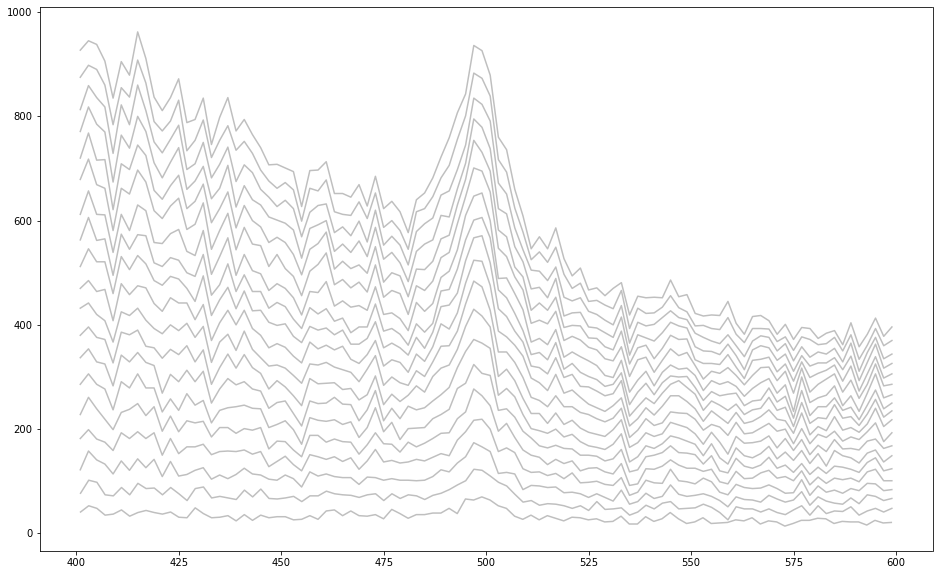

In [131]:
sXG, bXG = ROC_data_XG(test_data.v0_ks_mass, p_XG, plot=False)

[Text(0.5, 1.0, 'ROC Curve for XGBoost trained in MC and applied to data')]

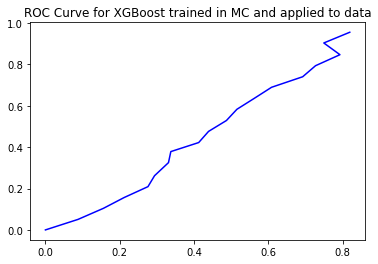

In [133]:
fig, ax = plt.subplots()
ax.plot(1-np.asarray(sXG)/max(sXG), 1-np.asarray(bXG)/max(bXG),'b-')
ax.set(title='ROC Curve for XGBoost trained in MC and applied to data')

XGBClassifier()

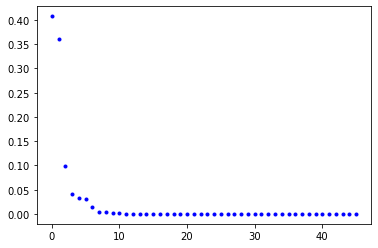

In [135]:
pca = PCA()
pca.fit(X_mc)

fig, ax = plt.subplots()
ax.plot(pca.explained_variance_ratio_,'b.')

pca = PCA(n_components=8)
model_XG.fit(pca.fit_transform(X_mc), Y_mc)

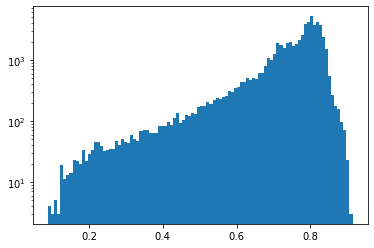

In [137]:
fig, ax = plt.subplots()
p = model_XG.predict_proba(pca.transform(X_data_test))[:,0]
ax.hist(p,bins=100);
ax.set_yscale('log')

0
1
1393.5705078465965
672.8758889988843
2
2045.3638284161589
1166.4400833656075
3
2457.6770163486835
1476.8947481888977
4
2672.8931630768748
1871.5956700358745
5
3171.3143146651237
2189.063902154654
6
3563.288118728115
2405.1346862711885
7
3949.2002544385928
2781.518597866944
8
4136.467549818034
3214.8988196999535
9
4397.537913770881
3507.2503756725055
10
4789.148402898609
3751.3451729274466
11
4905.135259761143
4028.265671759331
12
5143.00173736788
4256.282175708926
13
5070.475970985065
4465.103048927869
14
5234.850433320898
4714.712604363883
15
5746.957351568022
4870.897354635573
16
5742.677590776037
5354.440016260424
17
5626.732817247806
5495.1911225238755
18
5641.976158627471
5852.444340924246
19
No background valid minimum found!
6076.384752610535
5863.166434639101


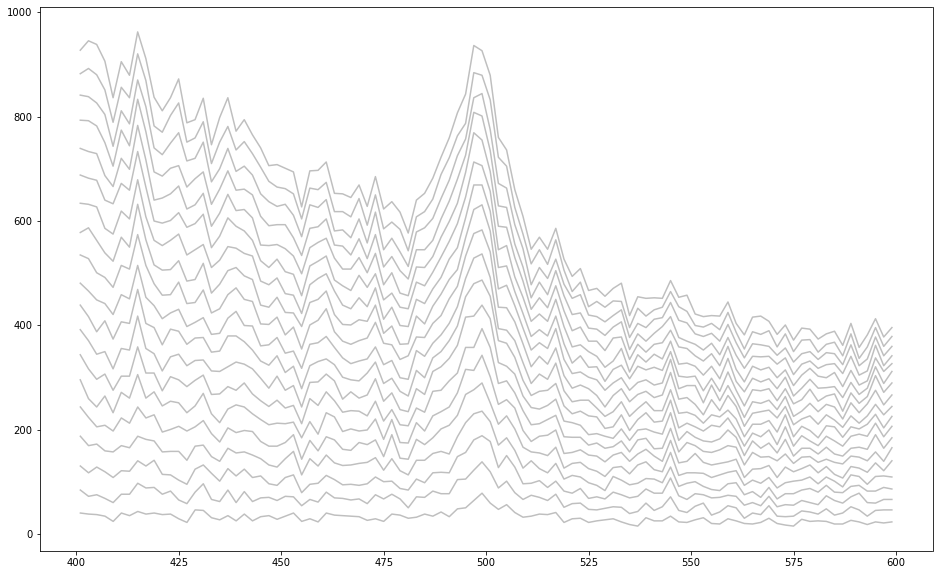

In [139]:
sPCA, bPCA = ROC_data_PCA(test_data.v0_ks_mass, p, plot=False)

[Text(0.5, 1.0, 'ROC Curve for XGBoost + PCA trained in MC and tested in data')]

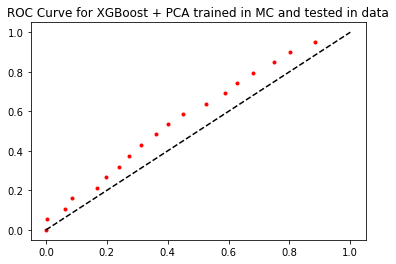

In [141]:
fig, ax = plt.subplots()
ax.plot(1-np.asarray(sPCA)/max(sPCA), 1-np.asarray(bPCA)/max(bPCA),'r.')
ax.plot(np.linspace(0,1,100), np.linspace(0,1,100), 'k--')
ax.set(title='ROC Curve for XGBoost + PCA trained in MC and tested in data')

#### Let's do training in data and test in MC now

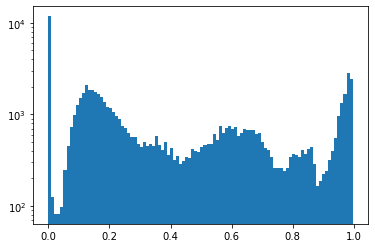

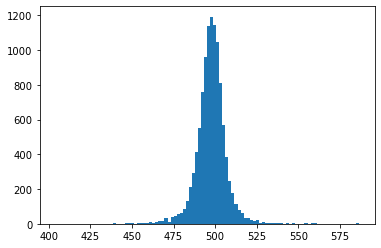

In [143]:
# First train in training data
model_XG=XGBClassifier()
setattr(model_XG, 'verbosity', 1)
model_XG.fit(X_data, y=Y_data)
p_XG = model_XG.predict_proba(X_mc_test)[:,1]
fig, ax = plt.subplots()
ax.hist(p_XG,bins=100);
ax.set_yscale('log')
fig, ax = plt.subplots()
ax.hist(test_mc.loc[p_XG>0.9].v0_ks_mass,bins=100);

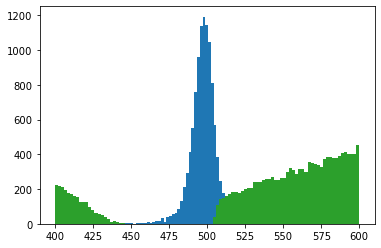

In [145]:
ax.hist(test_mc.loc[p_XG<0.1].v0_ks_mass,bins=100);
fig
##this is a lot better, mostly background out

0
1
2
3
No background valid minimum found!
4
5
6
No background valid minimum found!
No valid double gaussian minimum found after 250 tries!
7
8
9
10
11
12
13
14
15
16
17
18
19


divide by zero encountered in double_scalars


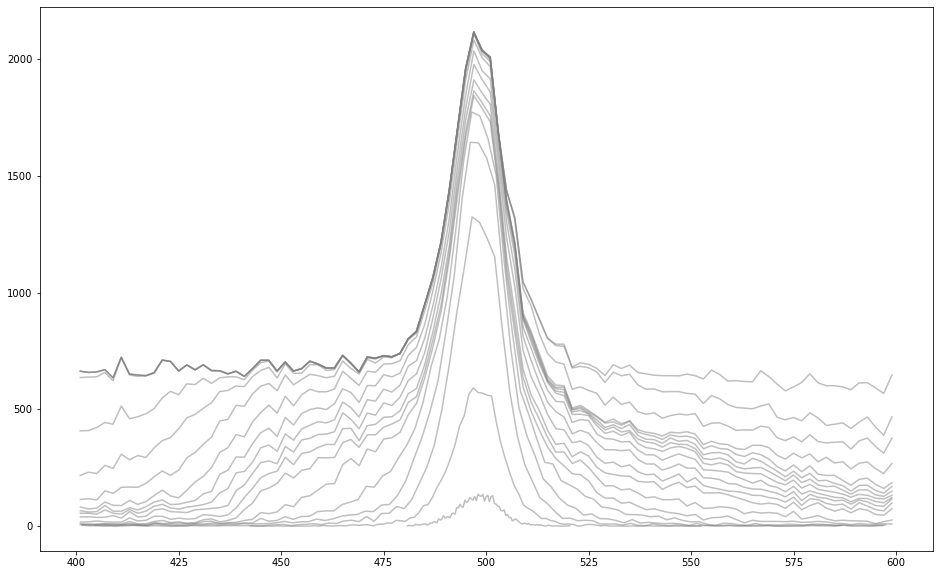

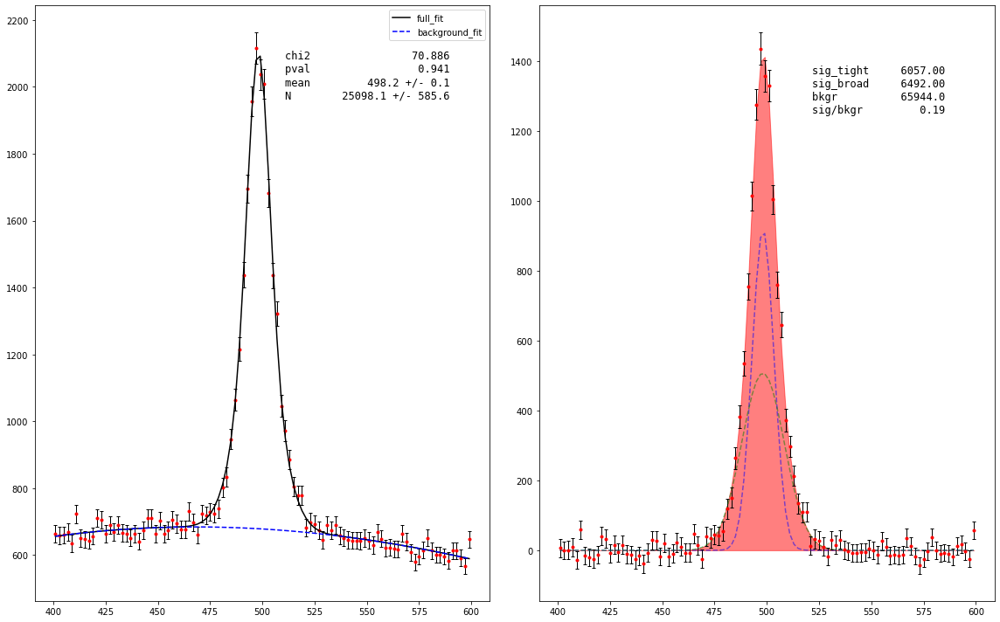

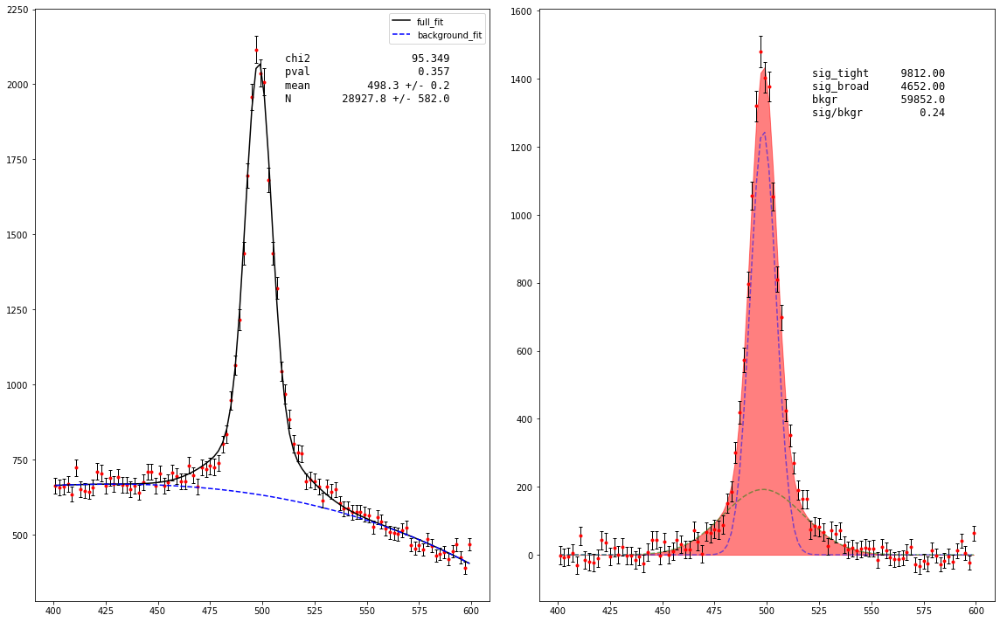

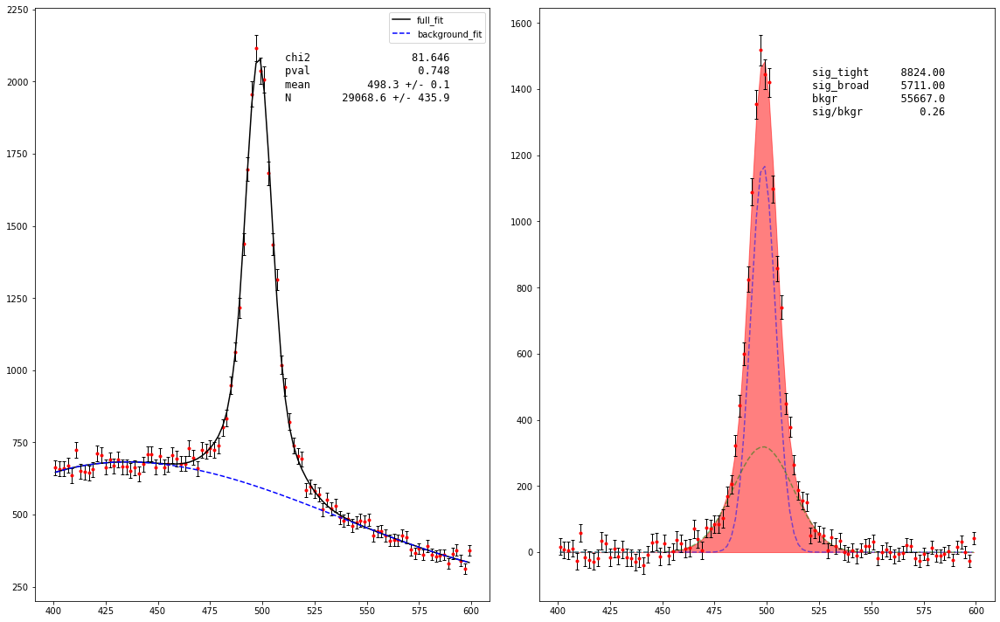

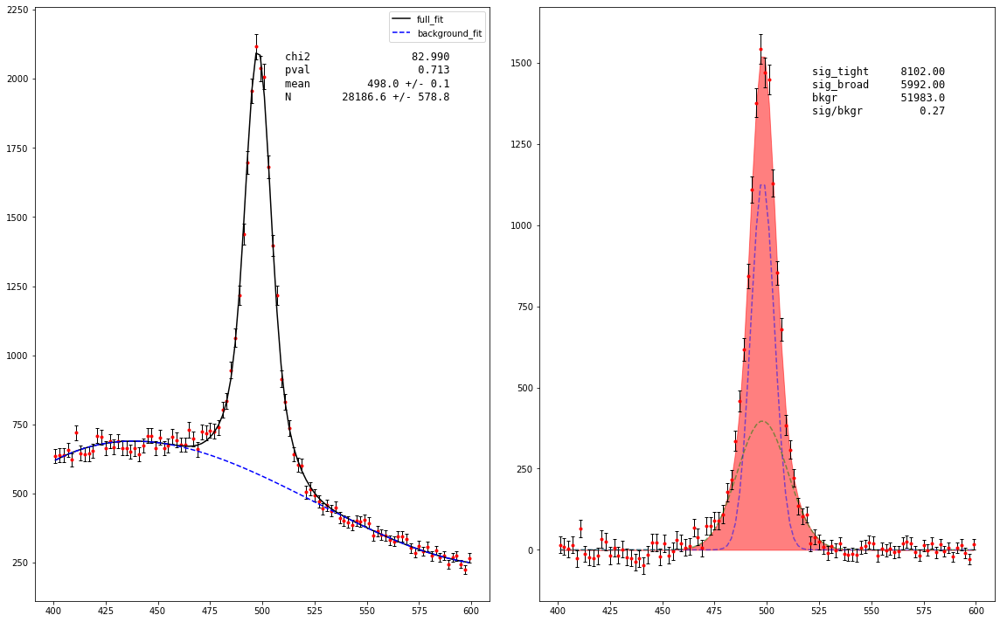

...

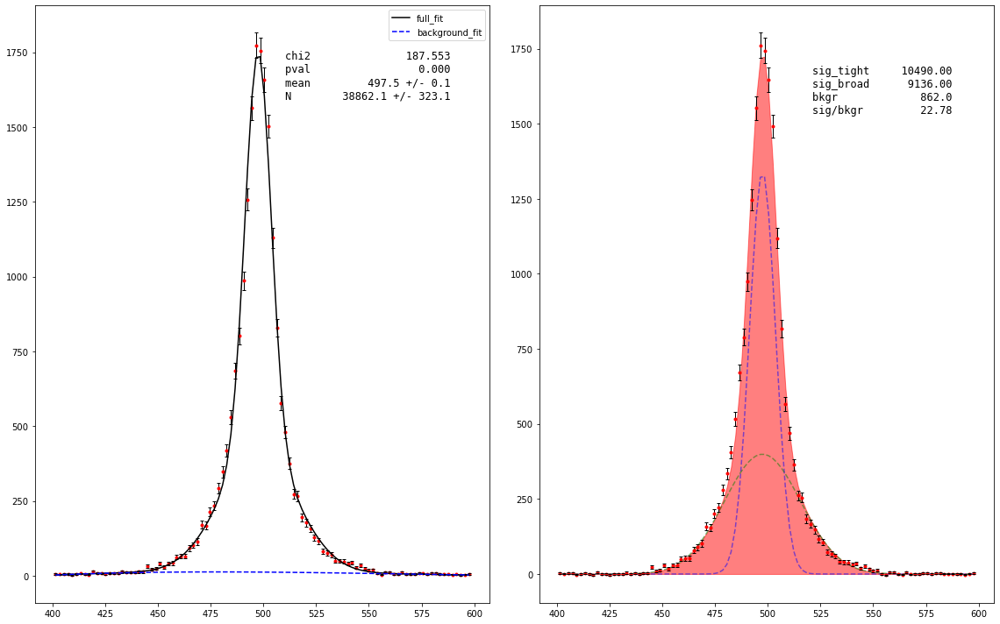

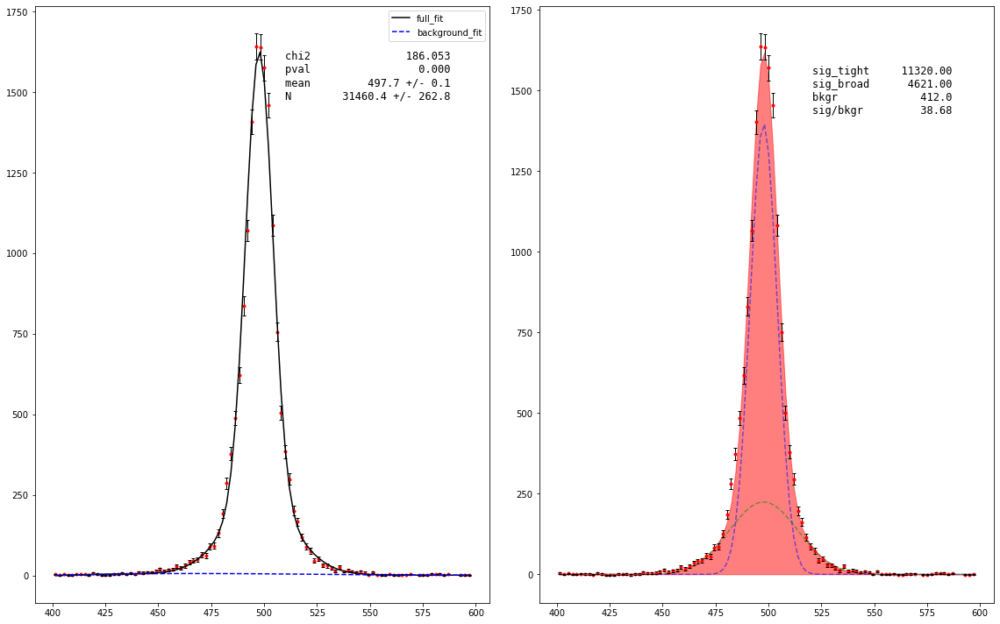

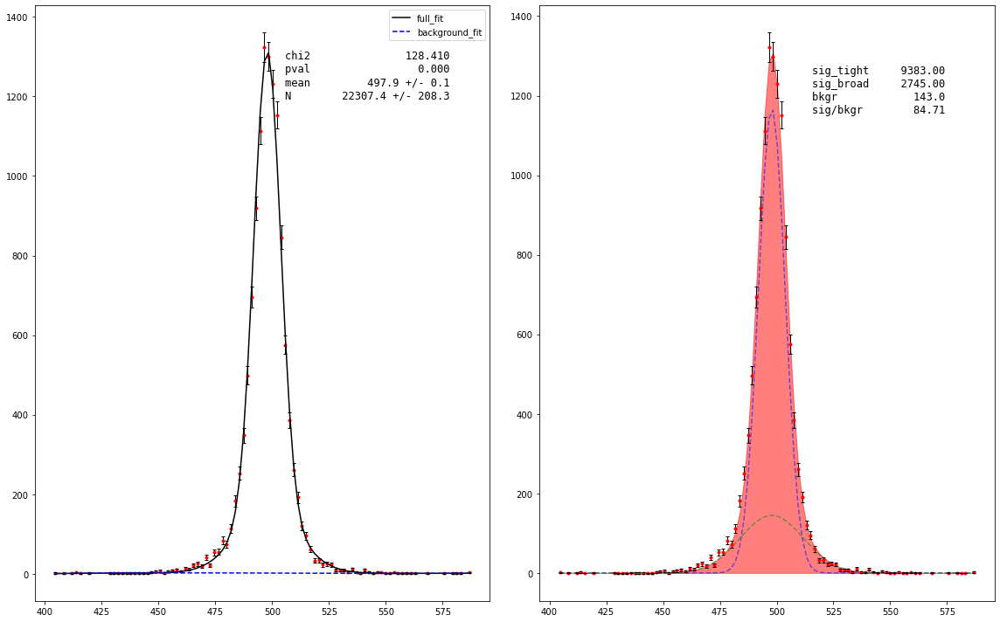

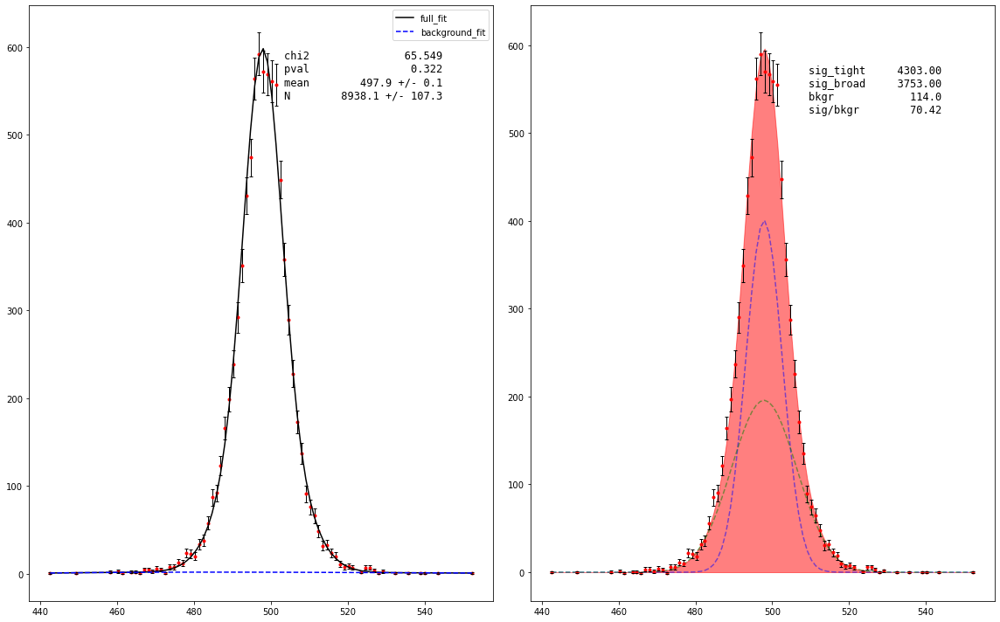

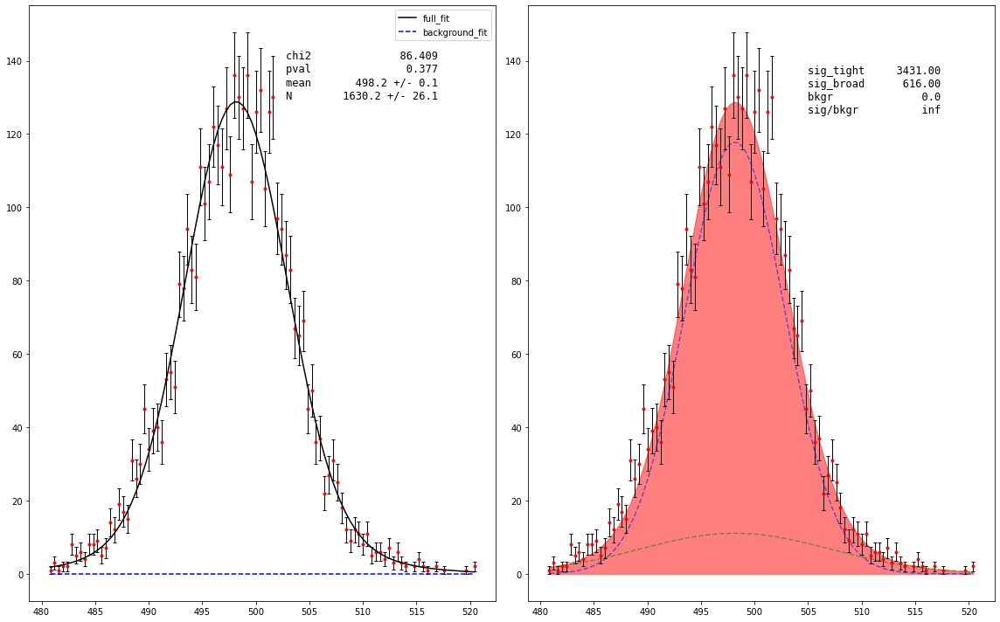

In [169]:
sXG, bXG = ROC_data_XG(test_mc.v0_ks_mass, p_XG, plot=True)

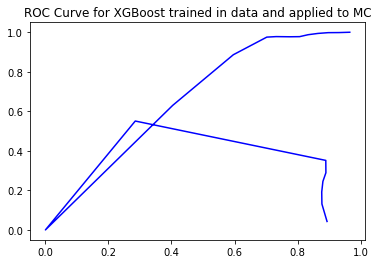

In [178]:
fig, ax = plt.subplots()
ax.plot(1-np.asarray(sXG)/max(sXG), 1-np.asarray(bXG)/max(bXG),'b-')
ax.set(title='ROC Curve for XGBoost trained in data and applied to MC');

0.9426771227964958


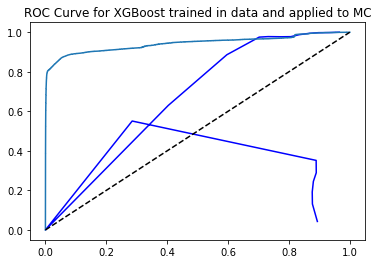

In [179]:
a = roc_curve(test_mc.trueKs,p_XG)
ax.plot(a[0], a[1])
ax.plot(np.linspace(0,1,100), np.linspace(0,1,100), 'k--')
print(roc_auc_score(test_mc.trueKs, p_XG))
fig